In [ ]:
pip install optuna

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 348 kB 8.5 MB/s 
     |████████████████████████████████| 209 kB 75.4 MB/s 
     |████████████████████████████████| 81 kB 12.7 MB/s 
     |████████████████████████████████| 78 kB 9.1 MB/s 
     |████████████████████████████████| 49 kB 8.0 MB/s 
     |████████████████████████████████| 147 kB 84.9 MB/s 
     |████████████████████████████████| 112 kB 104.4 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11137 sha256=4848b96bde928bae177e73eef9ad07e9a1efb7bd689793be64b53e81ac639b66
  Stored in directory: /root/.cache/pip/wheels/9f/18/84/8f69f8b08169c7bae2dde6bd7daf0c19fca8c8e500ee620a28
Successfully built pyperclip


In [ ]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.lines as lines
import matplotlib.gridspec as gridspec
import seaborn as sns

from datetime import datetime
from collections import Counter

from sklearn.preprocessing import LabelEncoder
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score, f1_score, RocCurveDisplay, PrecisionRecallDisplay, precision_recall_curve
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
import optuna
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xgb
from sklearn.calibration import CalibratedClassifierCV

from prettytable import PrettyTable
import joblib

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

<h1> HomeSite Quote Conversion </h1>

**Homesite** is a Property and Casualty Insurance Company headquartered in Boston, MA. It provides individuals, families, and businesses with customized, affordable insurance policies that help protect their home and property against serious financial loss due to unexpected events.<br>
-> Credits: https://go.homesite.com/

**Homesite Quote Conversion** is a kaggle competition which challenges us to predict which customers will purchase a given insurance quote (Quote Conversion). Quote Conversion is an important factor in determining the success of an insurance organization. Increasing the Quote Conversion Rate increases the organization's revenues. Therefore insurance organizations tries various methods to increase this Rate.

**Homesite** is providing us with its large anonymized database of information on customer and sales activity, including property and coverage information and asking us to design ML models which will help them in predicting which Quote will get converted into Sales. This will help them better understand the impact of proposed pricing changes and maintain an ideal portfolio of customer segments. 

-- Problem Statement:
1. Identify which Quotes are more likely to be purchased by client if presented

Solving this problem will help Insurance Organizations understand their client's needs and help them increase their revenues. It will also help clients indirectly as the organization will choose the best Quote for their client which will be based on a number of factors.

# Loading Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Train Dataset
df_tr=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/train.csv')

#Test Dataset
df_te=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/test.csv')

# EDA: Data Overview

In [ ]:
print('\033[1m'+'Train Dataset'+'\033[0m')
print("Number of Data-Points: ", df_tr.shape[0])
print("Number of Features: ", df_tr.shape[1])
df_tr.head()

Train Dataset
Number of Data-Points:  260753
Number of Features:  299


,QuoteNumber,Original_Quote_Date,QuoteConversion_Flag,Field6,Field7,Field8,Field9,Field10,Field11,Field12,CoverageField1A,CoverageField1B,CoverageField2A,CoverageField2B,CoverageField3A,CoverageField3B,CoverageField4A,CoverageField4B,CoverageField5A,CoverageField5B,CoverageField6A,CoverageField6B,CoverageField8,CoverageField9,CoverageField11A,CoverageField11B,SalesField1A,SalesField1B,SalesField2A,SalesField2B,SalesField3,SalesField4,SalesField5,SalesField6,SalesField7,SalesField8,SalesField9,SalesField10,SalesField11,SalesField12,SalesField13,SalesField14,SalesField15,PersonalField1,PersonalField2,PersonalField4A,PersonalField4B,PersonalField5,PersonalField6,PersonalField7,PersonalField8,PersonalField9,PersonalField10A,PersonalField10B,PersonalField11,PersonalField12,PersonalField13,PersonalField14,PersonalField15,PersonalField16,PersonalField17,PersonalField18,PersonalField19,PersonalField22,PersonalField23,PersonalField24,PersonalField25,PersonalField26,PersonalField27,PersonalField28,PersonalField29,PersonalField30,PersonalField31,PersonalField32,PersonalField33,PersonalField34,PersonalField35,PersonalField36,PersonalField37,PersonalField38,PersonalField39,PersonalField40,PersonalField41,PersonalField42,PersonalField43,PersonalField44,PersonalField45,PersonalField46,PersonalField47,PersonalField48,PersonalField49,PersonalField50,PersonalField51,PersonalField52,PersonalField53,PersonalField54,PersonalField55,PersonalField56,PersonalField57,PersonalField58,PersonalField59,PersonalField60,PersonalField61,PersonalField62,PersonalField63,PersonalField64,PersonalField65,PersonalField66,PersonalField67,PersonalField68,PersonalField69,PersonalField70,PersonalField71,PersonalField72,PersonalField73,PersonalField74,PersonalField75,PersonalField76,PersonalField77,PersonalField78,PersonalField79,PersonalField80,PersonalField81,PersonalField82,PersonalField83,PersonalField84,PropertyField1A,PropertyField1B,PropertyField2A,PropertyField2B,PropertyField3,PropertyField4,PropertyField5,PropertyField6,PropertyField7,PropertyField8,PropertyField9,PropertyField10,PropertyField11A,PropertyField11B,PropertyField12,PropertyField13,PropertyField14,PropertyField15,PropertyField16A,PropertyField16B,PropertyField17,PropertyField18,PropertyField19,PropertyField20,PropertyField21A,PropertyField21B,PropertyField22,PropertyField23,PropertyField24A,PropertyField24B,PropertyField25,PropertyField26A,PropertyField26B,PropertyField27,PropertyField28,PropertyField29,PropertyField30,PropertyField31,PropertyField32,PropertyField33,PropertyField34,PropertyField35,PropertyField36,PropertyField37,PropertyField38,PropertyField39A,PropertyField39B,GeographicField1A,GeographicField1B,GeographicField2A,GeographicField2B,GeographicField3A,GeographicField3B,GeographicField4A,GeographicField4B,GeographicField5A,GeographicField5B,GeographicField6A,GeographicField6B,GeographicField7A,GeographicField7B,GeographicField8A,GeographicField8B,GeographicField9A,GeographicField9B,GeographicField10A,GeographicField10B,GeographicField11A,GeographicField11B,GeographicField12A,GeographicField12B,GeographicField13A,GeographicField13B,GeographicField14A,GeographicField14B,GeographicField15A,GeographicField15B,GeographicField16A,GeographicField16B,GeographicField17A,GeographicField17B,GeographicField18A,GeographicField18B,GeographicField19A,GeographicField19B,GeographicField20A,GeographicField20B,GeographicField21A,GeographicField21B,GeographicField22A,GeographicField22B,GeographicField23A,GeographicField23B,GeographicField24A,GeographicField24B,GeographicField25A,GeographicField25B,GeographicField26A,GeographicField26B,GeographicField27A,GeographicField27B,GeographicField28A,GeographicField28B,GeographicField29A,GeographicField29B,GeographicField30A,GeographicField30B,GeographicField31A,GeographicField31B,GeographicField32A,GeographicField32B,GeographicField33A,GeographicField33B,GeographicField34A,GeographicField34B,GeographicField35A,GeographicField35B,GeographicField36A,GeographicFie

<h3>COLUMN Details:-</h3>

* **QuoteNumber:** Represents a potential customer.
* **Original_Quote_Date:** The date on which the Quote was offered.
* **QuoteConversion_Flag:** Whether the customer purchased the policy (1) or not (0). This variable acts as the depended variable.
* **Field{6 - 12}:** Anonymized Features probably representing basic information of the policy.
* **CoverageField{1A - 11B}:** Anonymized Features probably representing various information about coverage of the policy.
* **SalesField{1A - 15}:** Anonymized Features probably representing various information about sales of the policy.
* **PersonalField{1 - 84}:** Anonymized Features probably representing various personal information of the customer.
* **PropertyField{1A - 39B}:** Anonymized Features probably representing various information about the property which is under consideration for insurance.
* **GeographicField{1A - 64}:** Anonymized Features probably representing various information about the geography of the property’s location which is under consideration for insurance.

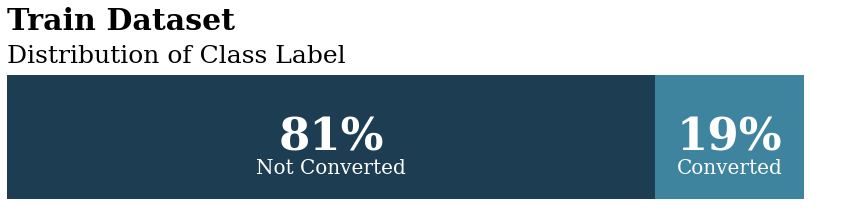

In [ ]:
# https://www.kaggle.com/code/joshuaswords/netflix-data-visualization/notebook
# Distribution of Class Label

#Store the number of 0 and 1 of 'QuoteConversion_Flag' in a single row DataFrame
df_tr_dep_var_count=pd.DataFrame(df_tr['QuoteConversion_Flag'].value_counts()).T
zero=df_tr_dep_var_count[0].values[0]
one=df_tr_dep_var_count[1].values[0]

fig, ax = plt.subplots(1,1,figsize=(15, 2.5))

ax.barh(df_tr_dep_var_count.index, df_tr_dep_var_count[0].values, color='#1C3D52')
ax.barh(df_tr_dep_var_count.index, df_tr_dep_var_count[1].values, left = df_tr_dep_var_count[0].values, color='#3E849E')

ax.annotate('{:.0f}%'.format((zero*100)/(zero+one)),xy=(zero/2,0), va='center', ha='center', fontfamily='serif', fontsize=45, fontweight=600, color='white')
ax.annotate('{:.0f}%'.format((one*100)/(zero+one)),xy= (zero+one/2,0), va='center', ha='center', fontfamily='serif', fontsize=45, fontweight=600, color='white')
ax.annotate('Not Converted',xy=(zero/2,-0.2), va='center', ha='center', fontfamily='serif', fontsize=20, fontweight=500, color='white')
ax.annotate('Converted',xy= (zero+one/2,-0.2), va='center', ha='center', fontfamily='serif', fontsize=20, fontweight=500, color='white')

#Remove all the ticks in both the axis
ax.set_xticks([])
ax.set_yticks([])

#Remove the axis lines on all four sides
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)

fig.text(0.125, 1.1, "Train Dataset", fontfamily='serif', fontsize=30, fontweight=600, color='black')
fig.text(0.125, 0.92, "Distribution of Class Label", fontfamily='serif', fontsize=25, fontweight=500, color='black')

plt.show()

> * We can see that the dataset is highly imbalanced. **81%** of the Quotes remain un-converted and only **19%** gets converted.

In [ ]:
print('\033[1m'+'Test Dataset'+'\033[0m')
print("Number of Data-Points: ", df_te.shape[0])
print("Number of Features: ", df_te.shape[1])
df_te.head()

Test Dataset
Number of Data-Points:  173836
Number of Features:  298


,QuoteNumber,Original_Quote_Date,Field6,Field7,Field8,Field9,Field10,Field11,Field12,CoverageField1A,CoverageField1B,CoverageField2A,CoverageField2B,CoverageField3A,CoverageField3B,CoverageField4A,CoverageField4B,CoverageField5A,CoverageField5B,CoverageField6A,CoverageField6B,CoverageField8,CoverageField9,CoverageField11A,CoverageField11B,SalesField1A,SalesField1B,SalesField2A,SalesField2B,SalesField3,SalesField4,SalesField5,SalesField6,SalesField7,SalesField8,SalesField9,SalesField10,SalesField11,SalesField12,SalesField13,SalesField14,SalesField15,PersonalField1,PersonalField2,PersonalField4A,PersonalField4B,PersonalField5,PersonalField6,PersonalField7,PersonalField8,PersonalField9,PersonalField10A,PersonalField10B,PersonalField11,PersonalField12,PersonalField13,PersonalField14,PersonalField15,PersonalField16,PersonalField17,PersonalField18,PersonalField19,PersonalField22,PersonalField23,PersonalField24,PersonalField25,PersonalField26,PersonalField27,PersonalField28,PersonalField29,PersonalField30,PersonalField31,PersonalField32,PersonalField33,PersonalField34,PersonalField35,PersonalField36,PersonalField37,PersonalField38,PersonalField39,PersonalField40,PersonalField41,PersonalField42,PersonalField43,PersonalField44,PersonalField45,PersonalField46,PersonalField47,PersonalField48,PersonalField49,PersonalField50,PersonalField51,PersonalField52,PersonalField53,PersonalField54,PersonalField55,PersonalField56,PersonalField57,PersonalField58,PersonalField59,PersonalField60,PersonalField61,PersonalField62,PersonalField63,PersonalField64,PersonalField65,PersonalField66,PersonalField67,PersonalField68,PersonalField69,PersonalField70,PersonalField71,PersonalField72,PersonalField73,PersonalField74,PersonalField75,PersonalField76,PersonalField77,PersonalField78,PersonalField79,PersonalField80,PersonalField81,PersonalField82,PersonalField83,PersonalField84,PropertyField1A,PropertyField1B,PropertyField2A,PropertyField2B,PropertyField3,PropertyField4,PropertyField5,PropertyField6,PropertyField7,PropertyField8,PropertyField9,PropertyField10,PropertyField11A,PropertyField11B,PropertyField12,PropertyField13,PropertyField14,PropertyField15,PropertyField16A,PropertyField16B,PropertyField17,PropertyField18,PropertyField19,PropertyField20,PropertyField21A,PropertyField21B,PropertyField22,PropertyField23,PropertyField24A,PropertyField24B,PropertyField25,PropertyField26A,PropertyField26B,PropertyField27,PropertyField28,PropertyField29,PropertyField30,PropertyField31,PropertyField32,PropertyField33,PropertyField34,PropertyField35,PropertyField36,PropertyField37,PropertyField38,PropertyField39A,PropertyField39B,GeographicField1A,GeographicField1B,GeographicField2A,GeographicField2B,GeographicField3A,GeographicField3B,GeographicField4A,GeographicField4B,GeographicField5A,GeographicField5B,GeographicField6A,GeographicField6B,GeographicField7A,GeographicField7B,GeographicField8A,GeographicField8B,GeographicField9A,GeographicField9B,GeographicField10A,GeographicField10B,GeographicField11A,GeographicField11B,GeographicField12A,GeographicField12B,GeographicField13A,GeographicField13B,GeographicField14A,GeographicField14B,GeographicField15A,GeographicField15B,GeographicField16A,GeographicField16B,GeographicField17A,GeographicField17B,GeographicField18A,GeographicField18B,GeographicField19A,GeographicField19B,GeographicField20A,GeographicField20B,GeographicField21A,GeographicField21B,GeographicField22A,GeographicField22B,GeographicField23A,GeographicField23B,GeographicField24A,GeographicField24B,GeographicField25A,GeographicField25B,GeographicField26A,GeographicField26B,GeographicField27A,GeographicField27B,GeographicField28A,GeographicField28B,GeographicField29A,GeographicField29B,GeographicField30A,GeographicField30B,GeographicField31A,GeographicField31B,GeographicField32A,GeographicField32B,GeographicField33A,GeographicField33B,GeographicField34A,GeographicField34B,GeographicField35A,GeographicField35B,GeographicField36A,GeographicField36B,GeographicField

<h3>COLUMN Details:-</h3>

* **QuoteNumber:** Represents a potential customer.
* **Original_Quote_Date:** The date on which the Quote was offered.
* **Field{6 - 12}:** Anonymized Features probably representing basic information of the policy.
* **CoverageField{1A - 11B}:** Anonymized Features probably representing various information about coverage of the policy.
* **SalesField{1A - 15}:** Anonymized Features probably representing various information about sales of the policy.
* **PersonalField{1 - 84}:** Anonymized Features probably representing various personal information of the customer.
* **PropertyField{1A - 39B}:** Anonymized Features probably representing various information about the property which is under consideration for insurance.
* **GeographicField{1A - 64}:** Anonymized Features probably representing various information about the geography of the property’s location which is under consideration for insurance.

# EDA: Data Cleaning

<h3>Check for Duplicate Data</h3>

> * We can check for duplicacy in **'QuoteNumber'** only as rest of the features can have duplicate values. We can also check for duplicacy of an entire row.

In [ ]:
#Train Dataset

print("Number of Duplicate Rows in \033[1mTrain\033[0m Dataset: ",df_tr[df_tr.duplicated()].shape[0])
print("Number of Duplicate Rows in \033[1m'QuoteNumber'\033[0m column in \033[1mTrain\033[0m Dataset: ",df_tr[df_tr.duplicated(subset=['QuoteNumber'])].shape[0])

Number of Duplicate Rows in Train Dataset:  0
Number of Duplicate Rows in 'QuoteNumber' column in Train Dataset:  0


In [ ]:
#Test Dataset

print("Number of Duplicate Rows in \033[1mTest\033[0m Dataset: ",df_te[df_te.duplicated()].shape[0])
print("Number of Duplicate Rows in \033[1m'QuoteNumber'\033[0m column in \033[1mTest\033[0m Dataset: ",df_te[df_te.duplicated(subset=['QuoteNumber'])].shape[0])

Number of Duplicate Rows in Test Dataset:  0
Number of Duplicate Rows in 'QuoteNumber' column in Test Dataset:  0


> * There is no duplicate rows in the **Train** and **Test** Dataset. Also **'QuoteNumber'** column in both datasets doesn't have any duplicate values

<h3>Check for presence of Same QuoteNumber in both Train and Test dataset</h3>

> * Same **'QuoteNumber'** cannot be present in both **Train** and **Test** dataset as it may lead to **Data Leakage**. We need to check for it and if present, then we need to further check whether the entire row is same or not. If the entire row is same, then we need to remove the row either from **Train** dataset or **Test** dataset.

In [ ]:
print("Number of Rows in \033[1mTrain\033[0m and \033[1mTest\033[0m Dataset having same \033[1mQuoteNumber\033[0m: ", pd.merge(df_tr['QuoteNumber'], df_te['QuoteNumber'], how='inner', on='QuoteNumber').shape[0])

Number of Rows in Train and Test Dataset having same QuoteNumber:  0


> * All the elements in **'QuoteNumber'** are different in **Train** and **Test** Dataset. Therefore there is no case of **Data Leakage**

<h3>Check for Null values Row-wise</h3>

In [ ]:
print("Percentage of Rows in \033[1mTrain\033[0m Dataset with atleast one Null value: \033[1m{:.2f} %\033[0m".format(df_tr[(df_tr.isna().sum(axis=1).values)>0].shape[0]*100/df_tr.shape[0]))
print("Percentage of Rows in \033[1mTest\033[0m Dataset with atleast one Null value: \033[1m{:.2f} %\033[0m".format(df_te[(df_te.isna().sum(axis=1).values)>0].shape[0]*100/df_te.shape[0]))

Percentage of Rows in Train Dataset with atleast one Null value: 78.81 %
Percentage of Rows in Test Dataset with atleast one Null value: 78.90 %


> * We can see that a large percentage of rows have atleast one null element in both **Train** and **Test** Dataset. 
> * **FEATURE ENGINEERING:** We can add a column having the count of all null values in each row for both the datasets.

In [ ]:
#Adding a column in Train Dataset having the count of all null values in each row

df_tr['#_Null_Elms']=df_tr.isna().sum(axis=1)
df_tr[['#_Null_Elms']].head()

,#_Null_Elms
0,0
1,2
2,2
3,2
4,0


In [ ]:
#Adding a column in Test Dataset having the count of all null values in each row

df_te['#_Null_Elms']=df_te.isna().sum(axis=1)
df_te[['#_Null_Elms']].head()

,#_Null_Elms
0,2
1,2
2,2
3,2
4,1


<h3>Creating a Column-Wise summary Dataframe for easy analysis</h3>

> * Since we have to look at column types and unique values of the columns a lot, We decided to create a Dataframe each for **Train** and **Test** dataset containing information about the Data Type, number of Null values, number of Unique Elements and the list of Unique Elements of each column

In [ ]:
def col_sum(df):
    
    '''This Function takes a DataFrame as input and creates and returns a DataFrame that contains information like Data Type of the column, 
    number of Null Elements in the column, number of Unique Elements in the column and the list of Unique Elements of
    the column. Since in some columns, the number of Unique Elements can be very high, we decided to put a 
    threshold of 100 on showing the Unique Elements of the columns i.e. if the number of Unique Elements is 
    less than or equal to 100, then the function will store all the unique elements of the column in the DataFrame,
    otherwise it will store N.A.'''
    
    df_col_summary=pd.DataFrame()
    df_col_summary['Data_Type']=df.dtypes
    df_col_summary['Null_Elms']=df.isna().sum()
    df_col_summary['#_Unique_Elms']=[df[col].unique().size for col in df.columns]
    
    uni_sort=[] # uni_sort will contain list of all unique elements of a feature in sorted order
    for col in df.columns:
        if df[col].unique().size<=100:
            # All the Unique Elements of the column is in 'uni'
            uni=df[col].unique()
            # 'uni' contains 'NaN' values as well which we have to remove for better analysis. We remove them and the sort the list.
            uni_sort.append(np.sort(np.delete(uni, np.where(pd.isna(uni) == True)))) 
        else:
            uni_sort.append('N.A')
    df_col_summary['Unique_Elms']=uni_sort
    
    return df_col_summary

In [ ]:
#For Train Dataset

df_tr_col_summary=col_sum(df_tr)
df_tr_col_summary

,Data_Type,Null_Elms,#_Unique_Elms,Unique_Elms
QuoteNumber,int64,0,260753,N.A
Original_Quote_Date,object,0,868,N.A
QuoteConversion_Flag,int64,0,2,"[0, 1]"
Field6,object,0,8,"[A, B, C, D, E, F, J, K]"
Field7,int64,0,28,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]"
Field8,float64,0,38,"[0.8746, 0.8793, 0.887, 0.8922, 0.8928, 0.893, 0.8945, 0.9023, 0.9108, 0.9153, 0.9194, 0.9219, 0.9223, 0.9258, 0.9313, 0.9364, 0.9368, 0.9375, 0.9392, 0.9403, 0.9472, 0.9482, 0.9485, 0.9487, 0.9489, 0.9497, 0.9525, 0.9559, 0.9566, 0.9685, 0.9691, 0.9769, 0.9838, 0.9893, 0.9919, 1.0005, 1.0006, 1.0101]"
Field9,float64,0,5,"[0.0004, 0.0006, 0.0007, 0.0038, 0.004]"
Field10,object,0,8,"[1,113, 1,165, 1,480, 1,487, 548, 564, 935, 965]"
Field11,float64,0,11,"[1.0, 1.02, 1.067, 1.1161, 1.1886, 1.2392, 1.2433, 1.2665, 1.2694, 1.2714, 1.3045]"
Field12,object,0,2,"[N, Y]"


> From initial glance we find that:-
> * In **Three** columns, the number of Unique Elements is more than **100** and in most of the columns, the number of Unique elements is less than or equal to **26**
> * There are only few columns which have Null Entries
> * Most of the columns are of **Integer** Data-type, some are of **Object** Data-type and very few are of **Float** Data-type

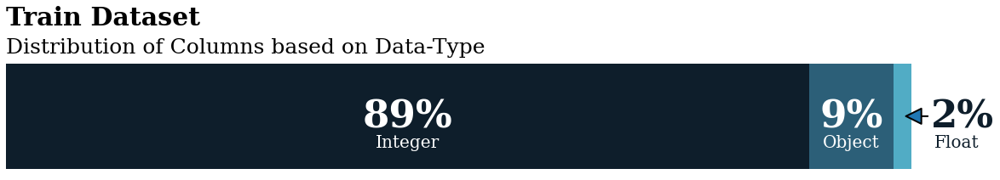

In [ ]:
# https://www.kaggle.com/code/joshuaswords/netflix-data-visualization/notebook
# Distribution of Columns in Train Dataset based on Data-Type

df_tr_col_summ_datatype=pd.DataFrame(df_tr_col_summary['Data_Type'].value_counts()).T
df_tr_col_summ_datatype.columns=['Integer', 'Obj', 'Float'] #renaming the columns as 'object' column name will create problem

int64=df_tr_col_summ_datatype['Integer'].values[0]
obj=df_tr_col_summ_datatype['Obj'].values[0]
float64=df_tr_col_summ_datatype['Float'].values[0]

fig, ax = plt.subplots(1,1,figsize=(20, 2.5))

ax.barh(df_tr_col_summ_datatype.index, df_tr_col_summ_datatype['Integer'].values, color='#0E1E2B')
ax.barh(df_tr_col_summ_datatype.index, df_tr_col_summ_datatype['Obj'].values, left = df_tr_col_summ_datatype['Integer'].values, color='#2C5F78')
ax.barh(df_tr_col_summ_datatype.index, df_tr_col_summ_datatype['Float'].values, left = df_tr_col_summ_datatype['Integer'].values+df_tr_col_summ_datatype['Obj'].values, color='#51ACC5')

ax.annotate('{:.0f}%'.format((int64*100)/(int64+obj+float64)),xy=(int64/2,0), va='center', ha='center', fontfamily='serif', fontsize=45, fontweight=600, color='white')
ax.annotate('{:.0f}%'.format((obj*100)/(int64+obj+float64)),xy= (int64+obj/2,0), va='center', ha='center', fontfamily='serif', fontsize=45, fontweight=600, color='white')
ax.annotate('{:.0f}%'.format((float64*100)/(int64+obj+float64)),xy= (int64+obj+float64/2,0), xytext = (int64+obj+float64/2+20,0), va='center', ha='center', fontfamily='serif', fontsize=45, fontweight=600, color='#0E1E2B', arrowprops={'arrowstyle':'-|>', 'lw':2})
ax.annotate('Integer',xy=(int64/2,-0.2), va='center', ha='center', fontfamily='serif', fontsize=20, fontweight=500, color='white')
ax.annotate('Object',xy= (int64+obj/2,-0.2), va='center', ha='center', fontfamily='serif', fontsize=20, fontweight=500, color='white')
ax.annotate('Float',xy= (int64+obj+float64/2+18,-0.2), va='center', ha='center', fontfamily='serif', fontsize=20, fontweight=500, color='#0E1E2B')

#Remove all the ticks in both the axis
ax.set_xticks([])
ax.set_yticks([])

#Remove the axis lines on all four sides
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)

fig.text(0.125, 1.1, "Train Dataset", fontfamily='serif', fontsize=30, fontweight=600, color='black')
fig.text(0.125, 0.92, "Distribution of Columns based on Data-Type", fontfamily='serif', fontsize=25, fontweight=500, color='black')

plt.show()

> * From above plot, we can see that in **Train** Dataset, **89%** of the columns are of **Integer** data-type, **9%** are of **Object** data-type and **2%** are of **Float** data-type

In [ ]:
#For Test Dataset

df_te_col_summary=col_sum(df_te)
df_te_col_summary

,Data_Type,Null_Elms,#_Unique_Elms,Unique_Elms
QuoteNumber,int64,0,173836,N.A
Original_Quote_Date,object,0,868,N.A
Field6,object,0,8,"[A, B, C, D, E, F, J, K]"
Field7,int64,0,28,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]"
Field8,float64,0,38,"[0.8746, 0.8793, 0.887, 0.8922, 0.8928, 0.893, 0.8945, 0.9023, 0.9108, 0.9153, 0.9194, 0.9219, 0.9223, 0.9258, 0.9313, 0.9364, 0.9368, 0.9375, 0.9392, 0.9403, 0.9472, 0.9482, 0.9485, 0.9487, 0.9489, 0.9497, 0.9525, 0.9559, 0.9566, 0.9685, 0.9691, 0.9769, 0.9838, 0.9893, 0.9919, 1.0005, 1.0006, 1.0101]"
Field9,float64,0,5,"[0.0004, 0.0006, 0.0007, 0.0038, 0.004]"
Field10,object,0,8,"[1,113, 1,165, 1,480, 1,487, 548, 564, 935, 965]"
Field11,float64,0,11,"[1.0, 1.02, 1.067, 1.1161, 1.1886, 1.2392, 1.2433, 1.2665, 1.2694, 1.2714, 1.3045]"
Field12,object,0,2,"[N, Y]"
CoverageField1A,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"


> From initial glance we find that:-
> * In **Three** columns, the number of Unique Elements is more than **100** and in most of the columns, the number of Unique elements is less than **26**
> * There are only few columns which have Null Entries
> * Most of the columns are of **Integer** Data-type, some are of **String ('object')** Data-type and very few are of **Float** Data-type

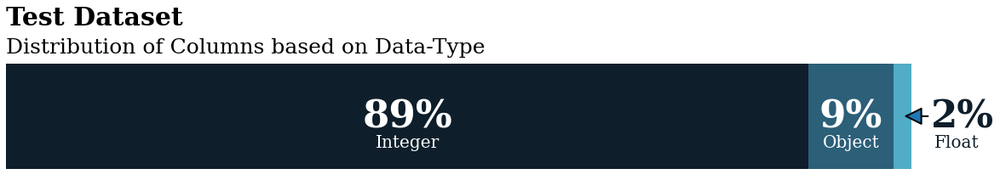

In [ ]:
# https://www.kaggle.com/code/joshuaswords/netflix-data-visualization/notebook
# Distribution of Columns in Test Dataset based on Data-Type

df_te_col_summ_datatype=pd.DataFrame(df_te_col_summary['Data_Type'].value_counts()).T
df_te_col_summ_datatype.columns=['Integer', 'Obj', 'Float'] #renaming the columns as 'object' column name will create problem

int64=df_te_col_summ_datatype['Integer'].values[0]
obj=df_te_col_summ_datatype['Obj'].values[0]
float64=df_te_col_summ_datatype['Float'].values[0]

fig, ax = plt.subplots(1,1,figsize=(20, 2.5))

ax.barh(df_te_col_summ_datatype.index, df_te_col_summ_datatype['Integer'].values, color='#0E1E2B')
ax.barh(df_te_col_summ_datatype.index, df_te_col_summ_datatype['Obj'].values, left = df_te_col_summ_datatype['Integer'].values, color='#2C5F78')
ax.barh(df_te_col_summ_datatype.index, df_te_col_summ_datatype['Float'].values, left = df_te_col_summ_datatype['Integer'].values+df_te_col_summ_datatype['Obj'].values, color='#51ACC5')

ax.annotate('{:.0f}%'.format((int64*100)/(int64+obj+float64)),xy=(int64/2,0), va='center', ha='center', fontfamily='serif', fontsize=45, fontweight=600, color='white')
ax.annotate('{:.0f}%'.format((obj*100)/(int64+obj+float64)),xy= (int64+obj/2,0), va='center', ha='center', fontfamily='serif', fontsize=45, fontweight=600, color='white')
ax.annotate('{:.0f}%'.format((float64*100)/(int64+obj+float64)),xy= (int64+obj+float64/2,0), xytext = (int64+obj+float64/2+20,0), va='center', ha='center', fontfamily='serif', fontsize=45, fontweight=600, color='#0E1E2B', arrowprops={'arrowstyle':'-|>', 'lw':2})
ax.annotate('Integer',xy=(int64/2,-0.2), va='center', ha='center', fontfamily='serif', fontsize=20, fontweight=500, color='white')
ax.annotate('Object',xy= (int64+obj/2,-0.2), va='center', ha='center', fontfamily='serif', fontsize=20, fontweight=500, color='white')
ax.annotate('Float',xy= (int64+obj+float64/2+18,-0.2), va='center', ha='center', fontfamily='serif', fontsize=20, fontweight=500, color='#0E1E2B')

#Remove all the ticks in both the axis
ax.set_xticks([])
ax.set_yticks([])

#Remove the axis lines on all four sides
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)

fig.text(0.125, 1.1, "Test Dataset", fontfamily='serif', fontsize=30, fontweight=600, color='black')
fig.text(0.125, 0.92, "Distribution of Columns based on Data-Type", fontfamily='serif', fontsize=25, fontweight=500, color='black')

plt.show()

> * From above plot, we can see that in **Test** Dataset, **89%** of the columns are of **Integer** data-type, **9%** are of **Object** data-type and **2%** are of **Float** data-type

<h3>Check for Column-wise Null values in Train Dataset</h3>

> * As part of Data Cleaning, we need to check for presence of Null Values in each column of **Train** dataset and if present, we need to take care of them

In [ ]:
df_tr_col_summary[df_tr_col_summary['Null_Elms']>0]

,Data_Type,Null_Elms,#_Unique_Elms,Unique_Elms
PersonalField7,object,113,3,"[N, Y]"
PersonalField84,float64,124208,8,"[1.0, 2.0, 3.0, 4.0, 5.0, 7.0, 8.0]"
PropertyField3,object,81,3,"[N, Y]"
PropertyField4,object,63,3,"[N, Y]"
PropertyField29,float64,200685,3,"[0.0, 1.0]"
PropertyField32,object,70,3,"[N, Y]"
PropertyField34,object,70,3,"[N, Y]"
PropertyField36,object,113,3,"[N, Y]"
PropertyField38,object,1220,3,"[N, Y]"


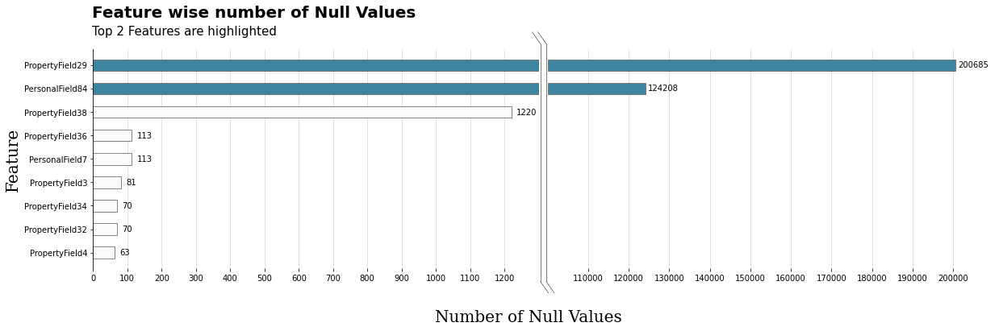

In [ ]:
# https://www.kaggle.com/code/joshuaswords/netflix-data-visualization/notebook
# https://matplotlib.org/3.1.0/gallery/subplots_axes_and_figures/broken_axis.html

# Column wise distribution of Null Values
# From above DataFrame, we can see that some columns have high number of Null values as compared to other columns.
# To accomodate all the above columns, we break the horizontal bar graph below into two parts on x axis. This is 
# done by plotting two subplots horizontally with a common y-axis.

df_temp=df_tr_col_summary[df_tr_col_summary['Null_Elms']>0]
df_temp.sort_values(by='Null_Elms', inplace=True)

colormap=['#FBFBFB']*len(df_temp)
colormap[-1]=colormap[-2]='#3E849E'

# Two subplots are used with shared y-axis. ax1 corresponds to right hand side subplot and ax2 corresponds to left hand side subplot
fig, (ax2, ax1) = plt.subplots(1,2,figsize=(20,5), sharey = True)

fig.text(0.124, 0.99, 'Feature wise number of Null Values ', fontsize=20, fontweight='600')
fig.text(0.124, 0.93, 'Top 2 Features are highlighted ', fontsize=15, fontweight='500')

ax1.barh(df_temp.index, df_temp['Null_Elms'], height=0.5, linewidth=0.8, edgecolor='#686868', color=colormap)
ax2.barh(df_temp.index, df_temp['Null_Elms'], height=0.5, linewidth=0.8, edgecolor='#686868', color=colormap)

for p in ax1.patches[-2:]:
    ax1.annotate(f"{int(p.get_width())}", xy=(p.get_x()+p.get_width()+500, p.get_y()+p.get_height()/2), va='center')

for q in ax2.patches[:-2]:
    ax2.annotate(f"{int(q.get_width())}", xy=(q.get_x()+q.get_width()+15, q.get_y()+q.get_height()/2), va='center')

ax1.set_xlim(100000,210000) # ax1's x-axis limit is set from 100000 to 210000 as it will show only high values
ax2.set_xlim(0,1300) # ax2's x-axis limit is set from 0 to 1300 as it will show only low values

#The axis lines on all four sides are removed for right hand side subplot
ax1.spines['top'].set_visible(False)
ax1.spines['left'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['bottom'].set_visible(False)
#The axis lines on all but left side are removed for left hand side subplot
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['bottom'].set_visible(False)

# Grid is set for ticks in x-axis only
ax1.grid(axis='x', alpha=0.5)
ax1.set_axisbelow(True)
ax2.grid(axis='x', alpha=0.5)
ax2.set_axisbelow(True)

ax1.yaxis.set_ticks_position('none') # ax1's ticks on y-axis is removed

ax2.set_xticks(list(range(0,1250,100))) # ax2's x-axis ticks are set from 0 to 1250 with differences of 100
ax1.set_xticks(list(range(110000,210000,10000))) # ax1's x-axis ticks are set from 110000 to 210000 with differences of 10000

# Below lines are used to separate the two subplots to show the break in x-axis
l1a = lines.Line2D([0.510, 0.503], [0.9, 0.94], transform=fig.transFigure, figure=fig, color='black',lw=0.5)
l1b = lines.Line2D([0.515, 0.508], [0.9, 0.94], transform=fig.transFigure, figure=fig, color='black',lw=0.5)
l2a = lines.Line2D([0.510, 0.510], [0.08, 0.9], transform=fig.transFigure, figure=fig, color='black',lw=0.5)
l2b = lines.Line2D([0.515, 0.515], [0.08, 0.9], transform=fig.transFigure, figure=fig, color='black',lw=0.5)
l3a = lines.Line2D([0.510, 0.517], [0.08, 0.04], transform=fig.transFigure, figure=fig, color='black',lw=0.5)
l3b = lines.Line2D([0.515, 0.522], [0.08, 0.04], transform=fig.transFigure, figure=fig, color='black',lw=0.5)
fig.lines.extend([l1a, l1b, l2a, l2b, l3a, l3b])

fig.subplots_adjust(wspace=0.02, hspace=0) # This adjusts the distance between subplots

fig.text(0.5, -0.06, "Number of Null Values", ha='center', fontsize=20, fontfamily='serif')
fig.text(0.05, 0.5, "Feature", va='center', rotation='vertical', fontsize=20, fontfamily='serif')

plt.show()

> * We can see that we have a total of **9** columns with Null values. We will impute **-1** in all these columns because as per the Competition Host in https://www.kaggle.com/competitions/homesite-quote-conversion/discussion/17382#99973, **-1** denotes a missing value.

In [ ]:
df_tr.fillna('-1', inplace=True)

In [ ]:
df_tr['PersonalField84']=df_tr['PersonalField84'].astype(int) # PersonalField84 is an interger data-type feature
df_tr['PropertyField29']=df_tr['PropertyField29'].astype(int) # PropertyField29 is an interger data-type feature

In [ ]:
# A temporary dataframe is created to check for column wise Null values
df_temp=pd.DataFrame(df_tr.isna().sum(), columns=['#_Null_Elms'])
df_temp[df_temp['#_Null_Elms']>0]

,#_Null_Elms


> * All the columns with Null Values are imputed with -1

<h3>Check for Column-wise Null values in Test Dataset</h3>

> * As part of Data Cleaning, we need to check for presence of Null Values in each column of **Test** dataset and if present, we need to take care of them

In [ ]:
df_te_col_summary[df_te_col_summary['Null_Elms']>0]

,Data_Type,Null_Elms,#_Unique_Elms,Unique_Elms
PersonalField7,object,69,3,"[N, Y]"
PersonalField84,float64,82812,6,"[1.0, 2.0, 3.0, 5.0, 7.0]"
PropertyField3,object,69,3,"[N, Y]"
PropertyField4,object,52,3,"[N, Y]"
PropertyField5,object,1,3,"[N, Y]"
PropertyField29,float64,133945,4,"[0.0, 1.0, 10.0]"
PropertyField30,object,1,3,"[N, Y]"
PropertyField32,object,41,3,"[N, Y]"
PropertyField34,object,41,3,"[N, Y]"
PropertyField36,object,67,3,"[N, Y]"


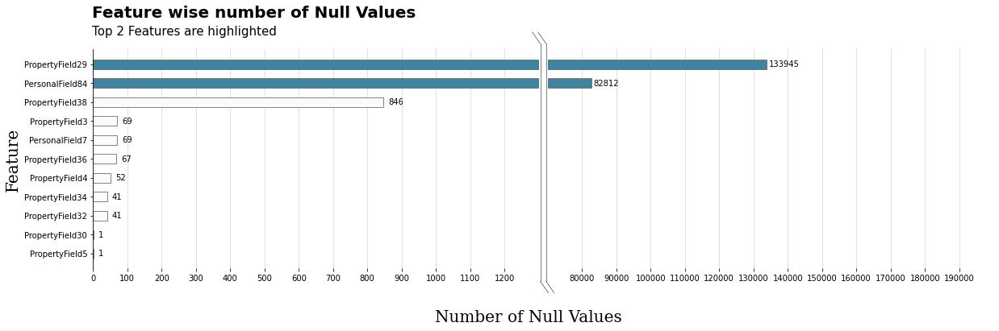

In [ ]:
# https://www.kaggle.com/code/joshuaswords/netflix-data-visualization/notebook
# https://matplotlib.org/3.1.0/gallery/subplots_axes_and_figures/broken_axis.html

# Column wise distribution of Null Values
# From above DataFrame, we can see that some columns have high number of Null values as compared to other columns.
# To accomodate all the above columns, we break the horizontal bar graph below into two parts on x axis. This is 
# done by plotting two subplots horizontally with a common y-axis.

df_temp=df_te_col_summary[df_te_col_summary['Null_Elms']>0]
df_temp.sort_values(by='Null_Elms', inplace=True)

colormap=['#FBFBFB']*len(df_temp)
colormap[-1]=colormap[-2]='#3E849E'

# Two subplots are used with shared y-axis. ax1 corresponds to right hand side subplot and ax2 corresponds to left hand side subplot
fig, (ax2, ax1) = plt.subplots(1,2,figsize=(20,5), sharey = True)

fig.text(0.124, 0.99, 'Feature wise number of Null Values ', fontsize=20, fontweight='600')
fig.text(0.124, 0.93, 'Top 2 Features are highlighted ', fontsize=15, fontweight='500')

ax1.barh(df_temp.index, df_temp['Null_Elms'], height=0.5, linewidth=0.8, edgecolor='#686868', color=colormap)
ax2.barh(df_temp.index, df_temp['Null_Elms'], height=0.5, linewidth=0.8, edgecolor='#686868', color=colormap)

for p in ax1.patches[-2:]:
    ax1.annotate(f"{int(p.get_width())}", xy=(p.get_x()+p.get_width()+500, p.get_y()+p.get_height()/2), va='center')

for q in ax2.patches[:-2]:
    ax2.annotate(f"{int(q.get_width())}", xy=(q.get_x()+q.get_width()+15, q.get_y()+q.get_height()/2), va='center')

ax1.set_xlim(70000,200000)# ax1's x-axis limit is set from 100000 to 210000 as it will show only high values
ax2.set_xlim(0,1300)# ax2's x-axis limit is set from 0 to 1300 as it will show only low values

#The axis lines on all four sides are removed for right hand side subplot
ax1.spines['top'].set_visible(False)
ax1.spines['left'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['bottom'].set_visible(False)
#The axis lines on all but left side are removed for left hand side subplot
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['bottom'].set_visible(False)

ax1.yaxis.set_ticks_position('none') # ax1's ticks on y-axis is removed

# Grid is set for ticks in x-axis only
ax1.grid(axis='x', alpha=0.5)
ax1.set_axisbelow(True)
ax2.grid(axis='x', alpha=0.5)
ax2.set_axisbelow(True)

ax2.set_xticks(list(range(0,1250,100)))# ax2's x-axis ticks are set from 0 to 1250 with differences of 100
ax1.set_xticks(list(range(80000,200000,10000)))# ax1's x-axis ticks are set from 110000 to 210000 with differences of 10000

# Below lines are used to separate to show the break in x-axis
l1a = lines.Line2D([0.510, 0.503], [0.9, 0.94], transform=fig.transFigure, figure=fig, color='black',lw=0.5)
l1b = lines.Line2D([0.515, 0.508], [0.9, 0.94], transform=fig.transFigure, figure=fig, color='black',lw=0.5)
l2a = lines.Line2D([0.510, 0.510], [0.08, 0.9], transform=fig.transFigure, figure=fig, color='black',lw=0.5)
l2b = lines.Line2D([0.515, 0.515], [0.08, 0.9], transform=fig.transFigure, figure=fig, color='black',lw=0.5)
l3a = lines.Line2D([0.510, 0.517], [0.08, 0.04], transform=fig.transFigure, figure=fig, color='black',lw=0.5)
l3b = lines.Line2D([0.515, 0.522], [0.08, 0.04], transform=fig.transFigure, figure=fig, color='black',lw=0.5)
fig.lines.extend([l1a, l1b, l2a, l2b, l3a, l3b])

fig.subplots_adjust(wspace=0.02, hspace=0)# This adjusts the distance between subplots

fig.text(0.5, -0.06, "Number of Null Values", ha='center', fontsize=20, fontfamily='serif')
fig.text(0.05, 0.5, "Feature", va='center', rotation='vertical', fontsize=20, fontfamily='serif')

plt.show()

> * We can see that we have a total of **11** columns with Null values. We will impute **-1** in all these columns because as per the Competition Host in https://www.kaggle.com/competitions/homesite-quote-conversion/discussion/17382#99973, **-1** denotes a misiing value.

In [ ]:
df_te.fillna('-1', inplace=True)

In [ ]:
df_te['PersonalField84']=df_te['PersonalField84'].astype(int) # PersonalField84 is an interger data-type feature
df_te['PropertyField29']=df_te['PropertyField29'].astype(int) # PropertyField29 is an interger data-type feature

In [ ]:
# A temporary dataframe is created to check for column wise Null values
df_temp=pd.DataFrame(df_te.isna().sum(), columns=['#_Null_Elms'])
df_temp[df_temp['#_Null_Elms']>0]

,#_Null_Elms


> * All the columns with Null Values are imputed with -1

<h3> Check for Columns which have only one Unique Value in Train Dataset</h3>

> * If any column has just one unique element, then it might not add much value in predicting the target variable and should be removed from the dataset

In [ ]:
df_tr_col_summary[df_tr_col_summary['#_Unique_Elms']<2]

,Data_Type,Null_Elms,#_Unique_Elms,Unique_Elms
PropertyField6,int64,0,1,[0]
GeographicField10A,int64,0,1,[-1]


> * **'PropertyField6'** and **'GeographicField10A'** has only one unique value. We will remove these features from the **Train** dataset

In [ ]:
df_tr.drop(['PropertyField6', 'GeographicField10A'], axis=1, inplace=True)
print("Is PropertyField6 column present in Train Dataset? ", 'PropertyField6' in df_tr)
print("Is GeographicField10A column present in Train Dataset? ", 'GeographicField10A' in df_tr)

Is PropertyField6 column present in Train Dataset?  False
Is GeographicField10A column present in Train Dataset?  False


<h3> Check for Columns which have only one Unique Value in Test Dataset</h3>

> * If any column has just one uniuque element, then it might not add much value in predicting the target variable and should be removed from the dataset

In [ ]:
df_te_col_summary[df_te_col_summary['#_Unique_Elms']<2]

,Data_Type,Null_Elms,#_Unique_Elms,Unique_Elms
PropertyField6,int64,0,1,[0]
GeographicField10A,int64,0,1,[-1]


> * **'PropertyField6'** and **'GeographicField10A'** has only one unique value. These were the same columns that we removed in **Train** Dataset. We will remove these features from the **Test** dataset as well

In [ ]:
df_te.drop(['PropertyField6', 'GeographicField10A'], axis=1, inplace=True)
print("Is PropertyField6 column present in Test Dataset? ", 'PropertyField6' in df_te)
print("Is GeographicField10A column present in Test Dataset? ", 'GeographicField10A' in df_te)

Is PropertyField6 column present in Test Dataset?  False
Is GeographicField10A column present in Test Dataset?  False


<h3>Updating df_tr_col_summary and df_te_col_summary</h3>

In [ ]:
df_tr_col_summary=col_sum(df_tr)
df_te_col_summary=col_sum(df_te)

<h3>Check for discrepancies in Categorical Columns of Train Dataset</h3>

In [ ]:
df_tr_col_summary[df_tr_col_summary['Data_Type']=='object']

,Data_Type,Null_Elms,#_Unique_Elms,Unique_Elms
Original_Quote_Date,object,0,868,N.A
Field6,object,0,8,"[A, B, C, D, E, F, J, K]"
Field10,object,0,8,"[1,113, 1,165, 1,480, 1,487, 548, 564, 935, 965]"
Field12,object,0,2,"[N, Y]"
CoverageField8,object,0,7,"[T, U, V, W, X, Y, Z]"
CoverageField9,object,0,12,"[A, B, C, D, E, F, G, H, I, J, K, L]"
SalesField7,object,0,7,"[K, M, P, Q, R, T, V]"
PersonalField7,object,0,3,"[-1, N, Y]"
PersonalField16,object,0,50,"[XB, XC, XD, XE, XF, XH, XI, XJ, XK, XL, XM, XN, XO, XP, XQ, XR, XS, XT, XU, XV, XW, XX, XY, XZ, YE, YF, YH, YI, ZA, ZB, ZC, ZD, ZE, ZF, ZG, ZH, ZI, ZJ, ZK, ZL, ZN, ZO, ZP, ZQ, ZR, ZS, ZT, ZU, ZV, ZW]"
PersonalField17,object,0,66,"[XB, XC, XD, XE, XG, XH, XI, XJ, XK, XL, XM, XN, XO, XP, XQ, XR, XS, XT, XU, XV, XW, XX, XY, YE, YF, YG, YH, YI, YJ, YK, YL, YM, YN, YP, YQ, YR, YS, YT, YU, YV, YW, YX, YY, YZ, ZA, ZB, ZC, ZD, ZE, ZF, ZG, ZH, ZI, ZK, ZL, ZM, ZN, ZO, ZP, ZQ, ZR, ZS, ZT, ZU, ZV, ZW]"


> From analysis of above dataframe, we find: 
> * **'Field10'** is an integer column but due to presence of **","**, it is converted to categorical column. We need to remove the comma and convert it to an Integer column
> * **GeographicField63** contains **' '** value alongwith **'N'** and **'Y'**. We need to impute it to the majority category
> * We need to check for any error in date values of **'Original_Quote_Date**

In [ ]:
# Removing commas from elements of 'Field10' and converting them to integers

temp=[]
for i in df_tr['Field10']:
    if ',' in i:
        temp.append(int(i.replace(',','')))
    else:
        temp.append(int(i))
df_tr['Field10']=temp

In [ ]:
df_tr['Field10'].dtypes

dtype('int64')

> * **'Field10'** is converted to Integer column

In [ ]:
#imputing majority value of 'GeographicField63' where ' ' is present

df_tr[df_tr['GeographicField63']==' '][['GeographicField63']]

,GeographicField63
157174,
225900,


> * For index number **157174** and **225900**, **'GeographicField63'** has **' '** value

In [ ]:
df_tr['GeographicField63'].value_counts()

N    254712
Y      6039
          2
Name: GeographicField63, dtype: int64

> * **'N'** is the majority category in **'GeographicField63'**

In [ ]:
df_tr['GeographicField63']=df_tr['GeographicField63'].replace([' '],['N'])

In [ ]:
df_tr['GeographicField63'].iloc[[157174, 225900]]

157174    N
225900    N
Name: GeographicField63, dtype: object

> * **' '** value in **'GeographicField63'** is replaced with **'N'**

In [ ]:
# Checking if any error is present in 'Original_Quote_Date' column

df_tr['Original_Quote_Date'].apply(lambda x: datetime.strptime(x, '%Y-%m-%d'))

0        2013-08-16
1        2014-04-22
2        2014-08-25
3        2013-04-15
4        2014-01-25
5        2014-01-18
6        2013-11-01
7        2014-05-14
8        2013-06-19
9        2013-06-18
10       2013-09-24
11       2013-06-11
12       2013-10-22
13       2013-08-20
14       2015-02-24
15       2014-10-27
16       2015-02-06
17       2013-10-02
18       2014-09-15
19       2013-06-18
20       2014-03-18
21       2014-10-15
22       2014-04-03
23       2015-03-31
24       2013-05-30
25       2015-03-30
26       2013-09-17
27       2015-03-07
28       2013-06-06
29       2013-01-22
30       2013-04-16
31       2014-03-04
32       2014-02-24
33       2015-05-12
34       2014-02-01
35       2013-08-12
36       2015-05-13
37       2014-04-13
38       2014-05-02
39       2015-05-18
40       2015-01-28
41       2013-12-30
42       2014-06-20
43       2014-01-08
44       2014-02-24
45       2014-10-08
46       2013-07-26
47       2013-07-11
48       2014-12-15
49       2014-12-08


> * Since no error is raised on executing the above code snippet, all the dates in **'Original_Quote_date'** are valid

> * We should also check for oldest and latest date in the **'Original_Quote_Date'** column

In [ ]:
print("The oldest date in \033[1m'Original_Quote_Date'\033[0m in \033[1mTrain\033[0m Dataset is: ",df_tr['Original_Quote_Date'].min())
print("The latest date in \033[1m'Original_Quote_Date'\033[0m in \033[1mTrain\033[0m Dataset is: ",df_tr['Original_Quote_Date'].max())

The oldest date in 'Original_Quote_Date' in Train Dataset is:  2013-01-01
The latest date in 'Original_Quote_Date' in Train Dataset is:  2015-05-18


> * The oldest date is **2013-01-01** and the latest date is **2015-05-18**

<h3>Check for discrepancies in Categorical Columns of Test Dataset</h3>

In [ ]:
df_te_col_summary[df_te_col_summary['Data_Type']=='object']

,Data_Type,Null_Elms,#_Unique_Elms,Unique_Elms
Original_Quote_Date,object,0,868,N.A
Field6,object,0,8,"[A, B, C, D, E, F, J, K]"
Field10,object,0,8,"[1,113, 1,165, 1,480, 1,487, 548, 564, 935, 965]"
Field12,object,0,2,"[N, Y]"
CoverageField8,object,0,7,"[T, U, V, W, X, Y, Z]"
CoverageField9,object,0,12,"[A, B, C, D, E, F, G, H, I, J, K, L]"
SalesField7,object,0,7,"[K, M, P, Q, R, T, V]"
PersonalField7,object,0,3,"[-1, N, Y]"
PersonalField16,object,0,44,"[XB, XC, XD, XE, XF, XG, XH, XI, XJ, XK, XL, XM, XO, XP, XQ, XR, XS, XT, XV, XW, XX, XZ, YE, YF, YG, YH, YI, ZA, ZB, ZC, ZD, ZE, ZF, ZG, ZH, ZI, ZJ, ZK, ZM, ZN, ZR, ZT, ZU, ZW]"
PersonalField17,object,0,64,"[XB, XC, XD, XE, XF, XG, XH, XI, XK, XL, XM, XN, XQ, XR, XS, XT, XU, XV, XW, XX, XZ, YE, YF, YG, YH, YI, YJ, YK, YL, YM, YN, YO, YQ, YR, YS, YT, YU, YV, YW, YX, YY, YZ, ZA, ZB, ZC, ZD, ZE, ZF, ZG, ZH, ZI, ZJ, ZK, ZL, ZM, ZN, ZO, ZP, ZQ, ZS, ZT, ZU, ZV, ZW]"


> From analysis of above dataframe, we find: 
> * **'Field10'** is an integer column but due to presence of **","**, it is converted to categorical column. We need to remove the comma and convert it to an Integer column
> * **PropertyField37** and **GeographicField63** contains **' '** value alongwith **'N'** and **'Y'**. We need to impute it to the majority category
> * We need to check for any error in date values of **'Original_Quote_Date**

In [ ]:
# Removing commas from elements of 'Field10' and converting them to integers

temp=[]
for i in df_te['Field10']:
    if ',' in i:
        temp.append(int(i.replace(',','')))
    else:
        temp.append(int(i))
df_te['Field10']=temp

In [ ]:
df_te['Field10'].dtypes

dtype('int64')

> * **'Field10'** is converted to Integer column

In [ ]:
#imputing majority value of 'PropertyField37' where ' ' is present

df_te[df_te['PropertyField37']==' '][['PropertyField37']]

,PropertyField37
131769,


> * For index number **131769**, **'PropertyField37'** has **' '** value

In [ ]:
df_tr['PropertyField37'].value_counts()

N    185976
Y     74777
Name: PropertyField37, dtype: int64

> * **'N'** is the majority category in **'PropertyField37'** in Training Dataset

In [ ]:
df_te['PropertyField37']=df_te['PropertyField37'].replace([' '],['N'])

In [ ]:
df_te['PropertyField37'].iloc[[131769]]

131769    N
Name: PropertyField37, dtype: object

> * **' '** value in **'PropertyField37'** is replaced with **'N'**

In [ ]:
#imputing majority value of 'GeographicField63' where ' ' is present

df_te[df_te['GeographicField63']==' '][['GeographicField63']]

,GeographicField63
42700,


> * For index number **42700**, **'GeographicField63'** has **' '** value

In [ ]:
df_tr['GeographicField63'].value_counts()

N    254714
Y      6039
Name: GeographicField63, dtype: int64

> * **'N'** is the majority category in **'GeographicField63'** in Training Dataset

In [ ]:
df_te['GeographicField63']=df_te['GeographicField63'].replace([' '],['N'])

In [ ]:
df_te['GeographicField63'].iloc[[42700]]

42700    N
Name: GeographicField63, dtype: object

> * **' '** value in **'GeographicField63'** is replaced with **'N'**

In [ ]:
# Checking if any error is present in 'Original_Quote_Date' column

df_te['Original_Quote_Date'].apply(lambda x: datetime.strptime(x, '%Y-%m-%d'))

0        2014-08-12
1        2013-09-07
2        2013-03-29
3        2015-03-21
4        2014-12-10
5        2013-07-19
6        2014-07-28
7        2015-01-20
8        2014-05-28
9        2013-07-11
10       2014-02-05
11       2015-02-27
12       2013-11-14
13       2015-02-02
14       2014-07-10
15       2013-05-21
16       2014-07-14
17       2014-03-08
18       2014-07-24
19       2014-04-02
20       2014-09-24
21       2014-09-19
22       2014-01-16
23       2013-08-27
24       2015-01-17
25       2013-05-22
26       2013-12-18
27       2015-01-22
28       2013-09-23
29       2014-09-14
30       2014-01-31
31       2014-09-15
32       2014-07-08
33       2014-10-06
34       2013-04-29
35       2015-05-04
36       2013-08-08
37       2014-01-17
38       2014-11-08
39       2014-02-19
40       2015-03-10
41       2013-06-25
42       2013-01-12
43       2013-10-23
44       2013-04-25
45       2014-04-02
46       2014-05-15
47       2014-02-12
48       2013-08-07
49       2014-12-18


> * Since no error is raised on executing the above code snippet, all the dates in **'Original_Quote_date'** are valid

> * We should also check for oldest and latest date in the **'Original_Quote_Date'** column

In [ ]:
print("The oldest date in \033[1m'Original_Quote_Date'\033[0m in \033[1mTest\033[0m Dataset is: ",df_te['Original_Quote_Date'].min())
print("The latest date in \033[1m'Original_Quote_Date'\033[0m in \033[1mTest\033[0m Dataset is: ",df_te['Original_Quote_Date'].max())

The oldest date in 'Original_Quote_Date' in Test Dataset is:  2013-01-01
The latest date in 'Original_Quote_Date' in Test Dataset is:  2015-05-18


> * The oldest date is **2013-01-01** and the latest date is **2015-05-18**

<h3>Check for discrepancies in Float Numeric Columns of Train Dataset</h3>

In [ ]:
df_tr_col_summary[df_tr_col_summary['Data_Type']=='float64']

,Data_Type,Null_Elms,#_Unique_Elms,Unique_Elms
Field8,float64,0,38,"[0.8746, 0.8793, 0.887, 0.8922, 0.8928, 0.893, 0.8945, 0.9023, 0.9108, 0.9153, 0.9194, 0.9219, 0.9223, 0.9258, 0.9313, 0.9364, 0.9368, 0.9375, 0.9392, 0.9403, 0.9472, 0.9482, 0.9485, 0.9487, 0.9489, 0.9497, 0.9525, 0.9559, 0.9566, 0.9685, 0.9691, 0.9769, 0.9838, 0.9893, 0.9919, 1.0005, 1.0006, 1.0101]"
Field9,float64,0,5,"[0.0004, 0.0006, 0.0007, 0.0038, 0.004]"
Field11,float64,0,11,"[1.0, 1.02, 1.067, 1.1161, 1.1886, 1.2392, 1.2433, 1.2665, 1.2694, 1.2714, 1.3045]"
PropertyField25,float64,0,11,"[0.0, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 5.0, 6.0, 7.0]"


> * No Discrepancies found in **Float** numeric columns of **Train** Dataset

<h3>Check for discrepancies in Float Numeric Columns of Test Dataset</h3>

In [ ]:
df_te_col_summary[df_te_col_summary['Data_Type']=='float64']

,Data_Type,Null_Elms,#_Unique_Elms,Unique_Elms
Field8,float64,0,38,"[0.8746, 0.8793, 0.887, 0.8922, 0.8928, 0.893, 0.8945, 0.9023, 0.9108, 0.9153, 0.9194, 0.9219, 0.9223, 0.9258, 0.9313, 0.9364, 0.9368, 0.9375, 0.9392, 0.9403, 0.9472, 0.9482, 0.9485, 0.9487, 0.9489, 0.9497, 0.9525, 0.9559, 0.9566, 0.9685, 0.9691, 0.9769, 0.9838, 0.9893, 0.9919, 1.0005, 1.0006, 1.0101]"
Field9,float64,0,5,"[0.0004, 0.0006, 0.0007, 0.0038, 0.004]"
Field11,float64,0,11,"[1.0, 1.02, 1.067, 1.1161, 1.1886, 1.2392, 1.2433, 1.2665, 1.2694, 1.2714, 1.3045]"
PropertyField25,float64,0,11,"[0.0, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 5.0, 6.0, 7.0]"


> * No Discrepancies found in **Float** numeric columns of **Test** Dataset

<h3>Check for discrepancies in Integer Numeric Columns of Train Dataset</h3>

In [ ]:
df_tr_col_summary[df_tr_col_summary['Data_Type']=='int64']

,Data_Type,Null_Elms,#_Unique_Elms,Unique_Elms
QuoteNumber,int64,0,260753,N.A
QuoteConversion_Flag,int64,0,2,"[0, 1]"
Field7,int64,0,28,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]"
CoverageField1A,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
CoverageField1B,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
CoverageField2A,int64,0,25,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
CoverageField2B,int64,0,25,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
CoverageField3A,int64,0,25,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
CoverageField3B,int64,0,25,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
CoverageField4A,int64,0,25,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"


> * No Discrepancies found in **Integer** numeric columns of **Train** Dataset through manual overlook

<h3>Check for discrepancies in Integer Numeric Columns of Test Dataset</h3>

In [ ]:
df_te_col_summary[df_te_col_summary['Data_Type']=='int64']

,Data_Type,Null_Elms,#_Unique_Elms,Unique_Elms
QuoteNumber,int64,0,173836,N.A
Field7,int64,0,28,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]"
CoverageField1A,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
CoverageField1B,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
CoverageField2A,int64,0,25,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
CoverageField2B,int64,0,25,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
CoverageField3A,int64,0,25,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
CoverageField3B,int64,0,25,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
CoverageField4A,int64,0,25,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
CoverageField4B,int64,0,25,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"


> * No Discrepancies found in **Integer** numeric columns of **Test** Dataset through manual overlook

<h3>Updating df_tr_col_summary and df_te_col_summary</h3>

In [ ]:
df_tr_col_summary=col_sum(df_tr)
df_te_col_summary=col_sum(df_te)

# Data Preprocessing

<h3>Segregating Year, Month and Day from 'Original_Quote_Date</h3>

> * We need to separate Year, Month, Day from entries in **'Original_Quote_Date'**. We will also add Weekday of the date. This will be done for better and easier analysis of the dataset.

In [ ]:
# Separating Year, Month, Day from 'Original_Quote_Year' in Train Dataset, adding Weekday of the date and then dropping 'Original_Quote_Year'

df_tr['Quote_Day']=pd.to_datetime(df_tr['Original_Quote_Date']).dt.day
df_tr['Quote_Weekday']=pd.to_datetime(df_tr['Original_Quote_Date']).dt.dayofweek
df_tr['Quote_Month']=pd.to_datetime(df_tr['Original_Quote_Date']).dt.month
df_tr['Quote_Year']=pd.to_datetime(df_tr['Original_Quote_Date']).dt.year
df_tr.drop(['Original_Quote_Date'], axis=1, inplace=True)
df_tr.head()

,QuoteNumber,QuoteConversion_Flag,Field6,Field7,Field8,Field9,Field10,Field11,Field12,CoverageField1A,CoverageField1B,CoverageField2A,CoverageField2B,CoverageField3A,CoverageField3B,CoverageField4A,CoverageField4B,CoverageField5A,CoverageField5B,CoverageField6A,CoverageField6B,CoverageField8,CoverageField9,CoverageField11A,CoverageField11B,SalesField1A,SalesField1B,SalesField2A,SalesField2B,SalesField3,SalesField4,SalesField5,SalesField6,SalesField7,SalesField8,SalesField9,SalesField10,SalesField11,SalesField12,SalesField13,SalesField14,SalesField15,PersonalField1,PersonalField2,PersonalField4A,PersonalField4B,PersonalField5,PersonalField6,PersonalField7,PersonalField8,PersonalField9,PersonalField10A,PersonalField10B,PersonalField11,PersonalField12,PersonalField13,PersonalField14,PersonalField15,PersonalField16,PersonalField17,PersonalField18,PersonalField19,PersonalField22,PersonalField23,PersonalField24,PersonalField25,PersonalField26,PersonalField27,PersonalField28,PersonalField29,PersonalField30,PersonalField31,PersonalField32,PersonalField33,PersonalField34,PersonalField35,PersonalField36,PersonalField37,PersonalField38,PersonalField39,PersonalField40,PersonalField41,PersonalField42,PersonalField43,PersonalField44,PersonalField45,PersonalField46,PersonalField47,PersonalField48,PersonalField49,PersonalField50,PersonalField51,PersonalField52,PersonalField53,PersonalField54,PersonalField55,PersonalField56,PersonalField57,PersonalField58,PersonalField59,PersonalField60,PersonalField61,PersonalField62,PersonalField63,PersonalField64,PersonalField65,PersonalField66,PersonalField67,PersonalField68,PersonalField69,PersonalField70,PersonalField71,PersonalField72,PersonalField73,PersonalField74,PersonalField75,PersonalField76,PersonalField77,PersonalField78,PersonalField79,PersonalField80,PersonalField81,PersonalField82,PersonalField83,PersonalField84,PropertyField1A,PropertyField1B,PropertyField2A,PropertyField2B,PropertyField3,PropertyField4,PropertyField5,PropertyField7,PropertyField8,PropertyField9,PropertyField10,PropertyField11A,PropertyField11B,PropertyField12,PropertyField13,PropertyField14,PropertyField15,PropertyField16A,PropertyField16B,PropertyField17,PropertyField18,PropertyField19,PropertyField20,PropertyField21A,PropertyField21B,PropertyField22,PropertyField23,PropertyField24A,PropertyField24B,PropertyField25,PropertyField26A,PropertyField26B,PropertyField27,PropertyField28,PropertyField29,PropertyField30,PropertyField31,PropertyField32,PropertyField33,PropertyField34,PropertyField35,PropertyField36,PropertyField37,PropertyField38,PropertyField39A,PropertyField39B,GeographicField1A,GeographicField1B,GeographicField2A,GeographicField2B,GeographicField3A,GeographicField3B,GeographicField4A,GeographicField4B,GeographicField5A,GeographicField5B,GeographicField6A,GeographicField6B,GeographicField7A,GeographicField7B,GeographicField8A,GeographicField8B,GeographicField9A,GeographicField9B,GeographicField10B,GeographicField11A,GeographicField11B,GeographicField12A,GeographicField12B,GeographicField13A,GeographicField13B,GeographicField14A,GeographicField14B,GeographicField15A,GeographicField15B,GeographicField16A,GeographicField16B,GeographicField17A,GeographicField17B,GeographicField18A,GeographicField18B,GeographicField19A,GeographicField19B,GeographicField20A,GeographicField20B,GeographicField21A,GeographicField21B,GeographicField22A,GeographicField22B,GeographicField23A,GeographicField23B,GeographicField24A,GeographicField24B,GeographicField25A,GeographicField25B,GeographicField26A,GeographicField26B,GeographicField27A,GeographicField27B,GeographicField28A,GeographicField28B,GeographicField29A,GeographicField29B,GeographicField30A,GeographicField30B,GeographicField31A,GeographicField31B,GeographicField32A,GeographicField32B,GeographicField33A,GeographicField33B,GeographicField34A,GeographicField34B,GeographicField35A,GeographicField35B,GeographicField36A,GeographicField36B,GeographicField37A,GeographicField37B,Geographic

In [ ]:
# Separating Year, Month, Day from 'Original_Quote_Year' in Test Dataset, adding Weekday of the date and then dropping 'Original_Quote_Year'

df_te['Quote_Day']=pd.to_datetime(df_te['Original_Quote_Date']).dt.day
df_te['Quote_Weekday']=pd.to_datetime(df_te['Original_Quote_Date']).dt.dayofweek
df_te['Quote_Month']=pd.to_datetime(df_te['Original_Quote_Date']).dt.month
df_te['Quote_Year']=pd.to_datetime(df_te['Original_Quote_Date']).dt.year
df_te.drop(['Original_Quote_Date'], axis=1, inplace=True)
df_te.head()

,QuoteNumber,Field6,Field7,Field8,Field9,Field10,Field11,Field12,CoverageField1A,CoverageField1B,CoverageField2A,CoverageField2B,CoverageField3A,CoverageField3B,CoverageField4A,CoverageField4B,CoverageField5A,CoverageField5B,CoverageField6A,CoverageField6B,CoverageField8,CoverageField9,CoverageField11A,CoverageField11B,SalesField1A,SalesField1B,SalesField2A,SalesField2B,SalesField3,SalesField4,SalesField5,SalesField6,SalesField7,SalesField8,SalesField9,SalesField10,SalesField11,SalesField12,SalesField13,SalesField14,SalesField15,PersonalField1,PersonalField2,PersonalField4A,PersonalField4B,PersonalField5,PersonalField6,PersonalField7,PersonalField8,PersonalField9,PersonalField10A,PersonalField10B,PersonalField11,PersonalField12,PersonalField13,PersonalField14,PersonalField15,PersonalField16,PersonalField17,PersonalField18,PersonalField19,PersonalField22,PersonalField23,PersonalField24,PersonalField25,PersonalField26,PersonalField27,PersonalField28,PersonalField29,PersonalField30,PersonalField31,PersonalField32,PersonalField33,PersonalField34,PersonalField35,PersonalField36,PersonalField37,PersonalField38,PersonalField39,PersonalField40,PersonalField41,PersonalField42,PersonalField43,PersonalField44,PersonalField45,PersonalField46,PersonalField47,PersonalField48,PersonalField49,PersonalField50,PersonalField51,PersonalField52,PersonalField53,PersonalField54,PersonalField55,PersonalField56,PersonalField57,PersonalField58,PersonalField59,PersonalField60,PersonalField61,PersonalField62,PersonalField63,PersonalField64,PersonalField65,PersonalField66,PersonalField67,PersonalField68,PersonalField69,PersonalField70,PersonalField71,PersonalField72,PersonalField73,PersonalField74,PersonalField75,PersonalField76,PersonalField77,PersonalField78,PersonalField79,PersonalField80,PersonalField81,PersonalField82,PersonalField83,PersonalField84,PropertyField1A,PropertyField1B,PropertyField2A,PropertyField2B,PropertyField3,PropertyField4,PropertyField5,PropertyField7,PropertyField8,PropertyField9,PropertyField10,PropertyField11A,PropertyField11B,PropertyField12,PropertyField13,PropertyField14,PropertyField15,PropertyField16A,PropertyField16B,PropertyField17,PropertyField18,PropertyField19,PropertyField20,PropertyField21A,PropertyField21B,PropertyField22,PropertyField23,PropertyField24A,PropertyField24B,PropertyField25,PropertyField26A,PropertyField26B,PropertyField27,PropertyField28,PropertyField29,PropertyField30,PropertyField31,PropertyField32,PropertyField33,PropertyField34,PropertyField35,PropertyField36,PropertyField37,PropertyField38,PropertyField39A,PropertyField39B,GeographicField1A,GeographicField1B,GeographicField2A,GeographicField2B,GeographicField3A,GeographicField3B,GeographicField4A,GeographicField4B,GeographicField5A,GeographicField5B,GeographicField6A,GeographicField6B,GeographicField7A,GeographicField7B,GeographicField8A,GeographicField8B,GeographicField9A,GeographicField9B,GeographicField10B,GeographicField11A,GeographicField11B,GeographicField12A,GeographicField12B,GeographicField13A,GeographicField13B,GeographicField14A,GeographicField14B,GeographicField15A,GeographicField15B,GeographicField16A,GeographicField16B,GeographicField17A,GeographicField17B,GeographicField18A,GeographicField18B,GeographicField19A,GeographicField19B,GeographicField20A,GeographicField20B,GeographicField21A,GeographicField21B,GeographicField22A,GeographicField22B,GeographicField23A,GeographicField23B,GeographicField24A,GeographicField24B,GeographicField25A,GeographicField25B,GeographicField26A,GeographicField26B,GeographicField27A,GeographicField27B,GeographicField28A,GeographicField28B,GeographicField29A,GeographicField29B,GeographicField30A,GeographicField30B,GeographicField31A,GeographicField31B,GeographicField32A,GeographicField32B,GeographicField33A,GeographicField33B,GeographicField34A,GeographicField34B,GeographicField35A,GeographicField35B,GeographicField36A,GeographicField36B,GeographicField37A,GeographicField37B,GeographicField38A,GeographicFi

<h3> Distribution of Target Variable Year-wise, Month-wise, Day-wise and Weekday-wise</h3>

> * Here we will try to find any relation/pattern in the distribution of target variable with respect to Quote issuance Year/Month/Day/Weekday wise. **Train** dataset is used here

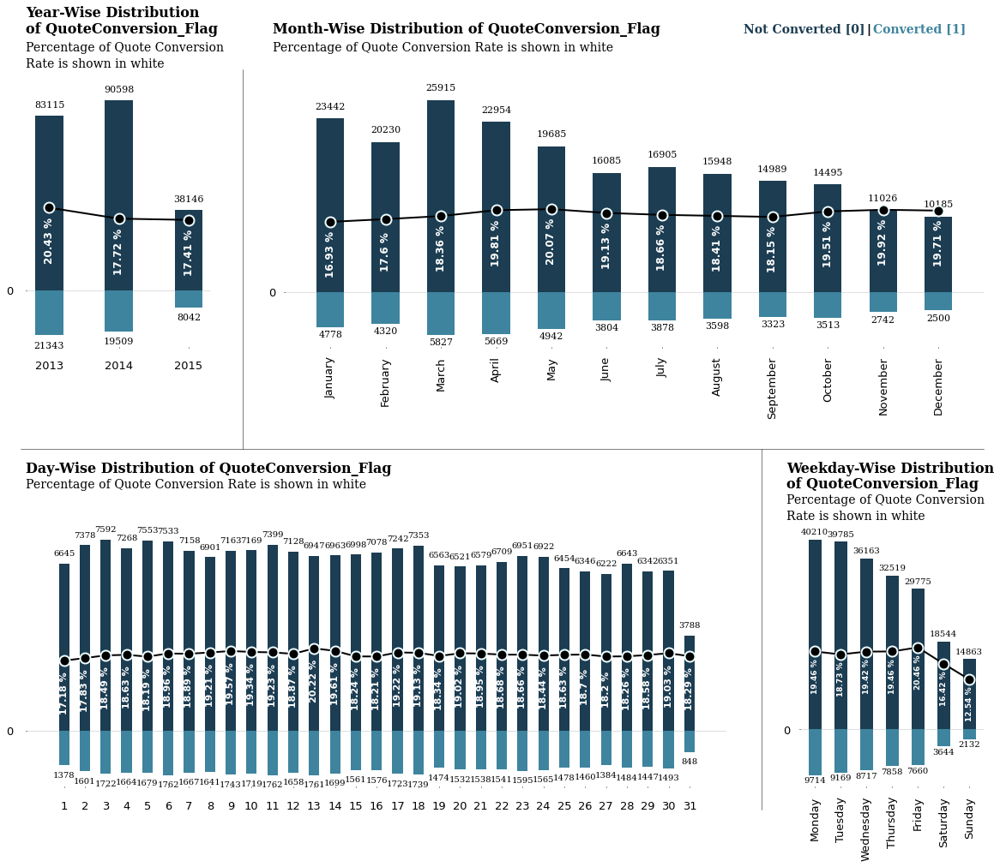

In [ ]:
# https://www.kaggle.com/code/joshuaswords/netflix-data-visualization/notebook
# Plotting distribution of Quote Conversions w.r.t Years, Months and Days

quote_year=df_tr.groupby('Quote_Year')['QuoteConversion_Flag'].value_counts().unstack()
quote_year['conv_rate'] = (quote_year[1]*100/(quote_year[0]+quote_year[1])).apply(lambda x: np.round(x,2)) # Year wise Quote Conversion Rate

quote_month=df_tr.groupby('Quote_Month')['QuoteConversion_Flag'].value_counts().unstack()
quote_month['conv_rate'] = (quote_month[1]*100/(quote_month[0]+quote_month[1])).apply(lambda x: np.round(x,2)) # Month wise Quote Conversion Rate

quote_day=df_tr.groupby('Quote_Day')['QuoteConversion_Flag'].value_counts().unstack()
quote_day['conv_rate'] = (quote_day[1]*100/(quote_day[0]+quote_day[1])).apply(lambda x: np.round(x,2)) # Day wise Quote Conversion Rate

quote_weekday=df_tr.groupby('Quote_Weekday')['QuoteConversion_Flag'].value_counts().unstack()
quote_weekday['conv_rate'] = (quote_weekday[1]*100/(quote_weekday[0]+quote_weekday[1])).apply(lambda x: np.round(x,2)) # Weekday wise Quote Conversion Rate

gs = gridspec.GridSpec(2,4) # the plot area is divided into 2x4 subplots

fig = plt.figure(figsize=(20,15))

#========================================================================================================================
#========================================================================================================================

# the first subplot is used here for Year-wise plot

ax = plt.subplot(gs[0,0]) 

fig.text(0.124, 0.957, 'Year-Wise Distribution', fontsize=16, fontweight=600, fontfamily='serif')
fig.text(0.124, 0.94, 'of QuoteConversion_Flag', fontsize=16, fontweight=600, fontfamily='serif')
fig.text(0.124, 0.92, 'Percentage of Quote Conversion', fontsize=14, fontweight=500, fontfamily='serif')
fig.text(0.124, 0.903, 'Rate is shown in white', fontsize=14, fontweight=500, fontfamily='serif')

ax.bar(quote_year.index, quote_year[0], width=0.4, color='#1C3D52') # Quotes which are not converted
ax.bar(quote_year.index, -quote_year[1], width=0.4, color='#3E849E') # Quotes which are converted

for i in enumerate(quote_year[0]):
    ax.annotate(f"{i[1]}", xy=(quote_year[0].index[i[0]], i[1]+5000), ha='center', va='center', fontfamily='serif', fontsize=11)

for i in enumerate(quote_year[1]):
    ax.annotate(f"{i[1]}", xy=(quote_year[1].index[i[0]], -i[1]-5000), ha='center', va='center', fontfamily='serif', fontsize=11)

ax.set_xticks(list(quote_year.index))
ax.tick_params(axis='x', pad=15, length=1, labelsize=13)

ax.set_yticks([0])
ax.tick_params(axis='y', pad=15, length=1, labelsize=13)

ax.grid(axis='y', alpha=0.5)
ax.set_axisbelow(True)

# The axis lines from top, left, right and bottom are removed
for s in ['top', 'left', 'right', 'bottom']:
    ax.spines[s].set_visible(False)

# Here a line plot will be used in the same area to denote the Quote Conversion Rate. To do that, secondary y axis is used
ax1=ax.twinx()
ax1.plot(quote_year.index, quote_year['conv_rate'], linewidth=2, markersize=12, marker='o', color='black', markeredgecolor='#ECFCFF', markeredgewidth=2)

for i in enumerate(quote_year['conv_rate']):
    ax1.annotate(f"{i[1]} %", xy=(quote_year['conv_rate'].index[i[0]], i[1]-8), ha='center', va='center', fontweight='600', fontfamily='sans-serif', fontsize=12, color='white', rotation=90)
    
ax1.set_ylim(-14,50)
ax1.set_yticks([])

# The axis lines from top, left, right and bottom are removed
for s in ['top', 'left', 'right', 'bottom']:
    ax1.spines[s].set_visible(False)
#========================================================================================================================
#========================================================================================================================

# all subplots in first row from second column to last column is used here for Month-wise plot

ax = plt.subplot(gs[0,1:])

fig.text(0.324, 0.94, 'Month-Wise Distribution of QuoteConversion_Flag', fontsize=16, fontweight=600, fontfamily='serif')
fig.text(0.324, 0.92, 'Percentage of Quote Conversion Rate is shown in white', fontsize=14, fontweight=500, fontfamily='serif')

ax.bar(quote_month.index, quote_month[0], width=0.5, color='#1C3D52') # Quotes which are not converted
ax.bar(quote_month.index, -quote_month[1], width=0.5, color='#3E849E') # Quotes which are converted

for i in enumerate(quote_month[0]):
    ax.annotate(f"{i[1]}", xy=(quote_month[0].index[i[0]], i[1]+1600), ha='center', va='center', fontfamily='serif', fontsize=11)

for i in enumerate(quote_month[1]):
    ax.annotate(f"{i[1]}", xy=(quote_month[1].index[i[0]], -i[1]-1000), ha='center', va='center', fontfamily='serif', fontsize=11)

plt.xticks(list(quote_month.index), ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'])
ax.tick_params(axis='x', pad=10, length=1, rotation=90, labelsize=13)

ax.set_yticks([0])
ax.tick_params(axis='y', pad=10, length=1, labelsize=13)

ax.grid(axis='y', alpha=0.5)
ax.set_axisbelow(True)

# The axis lines from top, left, right and bottom are removed
for s in ['top', 'left', 'right', 'bottom']:
    ax.spines[s].set_visible(False)

# Here a line plot will be used in the same area to denote the Quote Conversion Rate. To do that, secondary y axis is used
ax1=ax.twinx()
ax1.plot(quote_month.index, quote_month['conv_rate'], linewidth=2, markersize=12, marker='o', color='black', markeredgecolor='#ECFCFF', markeredgewidth=2)

for i in enumerate(quote_month['conv_rate']):
    ax1.annotate(f"{i[1]} %", xy=(quote_month['conv_rate'].index[i[0]], i[1]-8), ha='center', va='center', fontweight='600', fontfamily='sans-serif', fontsize=12, color='white', rotation=90)
    
ax1.set_ylim(-14,50)
ax1.set_yticks([])

# The axis lines from top, left, right and bottom are removed
for s in ['top', 'left', 'right', 'bottom']:
    ax1.spines[s].set_visible(False)
#========================================================================================================================
#========================================================================================================================
    
# all subplots in the second row from first column to third column is used here for Day-wise plot
ax = plt.subplot(gs[1,:3])

fig.text(0.124, 0.465, 'Day-Wise Distribution of QuoteConversion_Flag', fontsize=16, fontweight=600, fontfamily='serif')
fig.text(0.124, 0.448, 'Percentage of Quote Conversion Rate is shown in white', fontsize=14, fontweight=500, fontfamily='serif')

ax.bar(quote_day.index, quote_day[0], width=0.5, color='#1C3D52')
ax.bar(quote_day.index, -quote_day[1], width=0.5, color='#3E849E')

for i in enumerate(quote_day[0]):
    ax.annotate(f"{i[1]}", xy=(quote_day[0].index[i[0]], i[1]+400), ha='center', va='center', fontfamily='serif', fontsize=10)

for i in enumerate(quote_day[1]):
    ax.annotate(f"{i[1]}", xy=(quote_day[1].index[i[0]], -i[1]-400), ha='center', va='center', fontfamily='serif', fontsize=10)

ax.set_xticks(list(quote_day.index))
ax.tick_params(axis='x', pad=15, length=1, labelsize=13)

ax.set_yticks([0])
ax.tick_params(axis='y', pad=15, length=1, labelsize=13)

ax.grid(axis='y', alpha=0.5)
ax.set_axisbelow(True)

# The axis lines from top, left, right and bottom are removed
for s in ['top', 'left', 'right', 'bottom']:
    ax.spines[s].set_visible(False)

# Here a line plot will be used in the same area to denote the Quote Conversion Rate. To do that, secondary y axis is used
ax1=ax.twinx()
ax1.plot(quote_day.index, quote_day['conv_rate'], linewidth=2, markersize=12, marker='o', color='black', markeredgecolor='#ECFCFF', markeredgewidth=2)

for i in enumerate(quote_day['conv_rate']):
    ax1.annotate(f"{i[1]} %", xy=(quote_day['conv_rate'].index[i[0]], i[1]-8), ha='center', va='center', fontweight='600', fontfamily='sans-serif', fontsize=11, color='white', rotation=90)
    
ax1.set_ylim(-14,50)
ax1.set_yticks([])

# The axis lines from top, left, right and bottom are removed
for s in ['top', 'left', 'right', 'bottom']:
    ax1.spines[s].set_visible(False)
    
#========================================================================================================================
#========================================================================================================================

# the subplot in last row and last column is used here for Weekday-wise plot

ax = plt.subplot(gs[1,3])

fig.text(0.74, 0.465, 'Weekday-Wise Distribution', fontsize=16, fontweight=600, fontfamily='serif')
fig.text(0.74, 0.448, 'of QuoteConversion_Flag', fontsize=16, fontweight=600, fontfamily='serif')
fig.text(0.74, 0.431, 'Percentage of Quote Conversion', fontsize=14, fontweight=500, fontfamily='serif')
fig.text(0.74, 0.414, 'Rate is shown in white', fontsize=14, fontweight=500, fontfamily='serif')

ax.bar(quote_weekday.index, quote_weekday[0], width=0.5, color='#1C3D52') # Quotes which are not converted
ax.bar(quote_weekday.index, -quote_weekday[1], width=0.5, color='#3E849E') # Quotes which are converted

for i in enumerate(quote_weekday[0]):
    ax.annotate(f"{i[1]}", xy=(quote_weekday[0].index[i[0]], i[1]+1600), ha='center', va='center', fontfamily='serif', fontsize=10)

for i in enumerate(quote_weekday[1]):
    ax.annotate(f"{i[1]}", xy=(quote_weekday[1].index[i[0]], -i[1]-1200), ha='center', va='center', fontfamily='serif', fontsize=10)

plt.xticks(list(quote_weekday.index), ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
ax.tick_params(axis='x', pad=10, length=1, rotation=90, labelsize=13)

ax.set_yticks([0])
ax.tick_params(axis='y', pad=10, length=1, labelsize=13)

ax.grid(axis='y', alpha=0.5)
ax.set_axisbelow(True)

# The axis lines from top, left, right and bottom are removed
for s in ['top', 'left', 'right', 'bottom']:
    ax.spines[s].set_visible(False)

# Here a line plot will be used in the same area to denote the Quote Conversion Rate. To do that, secondary y axis is used
ax1=ax.twinx()
ax1.plot(quote_weekday.index, quote_weekday['conv_rate'], linewidth=2, markersize=12, marker='o', color='black', markeredgecolor='#ECFCFF', markeredgewidth=2)

for i in enumerate(quote_weekday['conv_rate']):
    ax1.annotate(f"{i[1]} %", xy=(quote_weekday['conv_rate'].index[i[0]], i[1]-6), ha='center', va='center', fontweight='600', fontfamily='sans-serif', fontsize=9, color='white', rotation=90)
    
ax1.set_ylim(-14,50)
ax1.set_yticks([])

# The axis lines from top, left, right and bottom are removed
for s in ['top', 'left', 'right', 'bottom']:
    ax1.spines[s].set_visible(False)

#========================================================================================================================
#========================================================================================================================

# here lines are used to separate the four plots
l1 = lines.Line2D([0.3, 0.3], [0.49, 0.9], transform=fig.transFigure, figure=fig, color='black',lw=0.5)
l2 = lines.Line2D([0.12, 0.9], [0.49, 0.49], transform=fig.transFigure, figure=fig, color='black',lw=0.5)
l3 = lines.Line2D([0.72, 0.72], [0.10, 0.49], transform=fig.transFigure, figure=fig, color='black',lw=0.5)
fig.lines.extend([l1, l2, l3])

fig.text(0.705, 0.94, 'Not Converted [0]', fontsize=14, fontweight=600, color='#1C3D52', fontfamily='serif')
fig.text(0.805, 0.94, '|', fontsize=14, fontweight=600, color='black')
fig.text(0.810, 0.94, 'Converted [1]', fontsize=14, fontweight=600, color='#3E849E', fontfamily='serif')

fig.subplots_adjust(wspace=0.4, hspace=0.7) # this adjusts the horizontal and vertical space between subplots

plt.show()

> * When absolute number of target variable is concerned, the **Year-wise** and **Day-wise** plot doesn't provide any clear pattern. But for **Month-wise** plot, we can see that from **January** to **December**, overall count of target variable decreases with the highest in **March** and the lowest in **December**. Similarly for **Weekday** wise plot, the overall count of target variables decreases with highest on **Monday** and lowest on **Sunday**
> * When **Percentage of Quote Conversion Rate** is considered, it remains almost at the same level in all the plots except for **Weekdays** plot. For **Weekdays** plot, the **Percentage of Quote Conversion Rate** remains almost constant on weekdays but decreases on weekends.

<h3>Updating df_tr_col_summary and df_te_col_summary</h3>

In [ ]:
df_tr_col_summary=col_sum(df_tr)
df_te_col_summary=col_sum(df_te)

<h3>Features with Two Unique elements</h3>

> * Features that has only two unique elements tends to be a feature asking a binary question. We should check them out in our datasets and see what insights we can find from them

In [ ]:
df_tr_col_summary[df_tr_col_summary['#_Unique_Elms']==2]

,Data_Type,Null_Elms,#_Unique_Elms,Unique_Elms
QuoteConversion_Flag,int64,0,2,"[0, 1]"
Field12,object,0,2,"[N, Y]"
SalesField3,int64,0,2,"[0, 1]"
SalesField9,int64,0,2,"[0, 1]"
PersonalField1,int64,0,2,"[0, 1]"
PersonalField2,int64,0,2,"[0, 1]"
PersonalField6,int64,0,2,"[0, 1]"
PropertyField2A,int64,0,2,"[-1, 25]"
PropertyField5,object,0,2,"[N, Y]"
PropertyField8,int64,0,2,"[0, 1]"


In [ ]:
df_tr_col_summary[(df_tr_col_summary['#_Unique_Elms']==3) & (df_tr_col_summary['Data_Type']=='object')]

,Data_Type,Null_Elms,#_Unique_Elms,Unique_Elms
PersonalField7,object,0,3,"[-1, N, Y]"
PropertyField3,object,0,3,"[-1, N, Y]"
PropertyField4,object,0,3,"[-1, N, Y]"
PropertyField32,object,0,3,"[-1, N, Y]"
PropertyField34,object,0,3,"[-1, N, Y]"
PropertyField36,object,0,3,"[-1, N, Y]"
PropertyField38,object,0,3,"[-1, N, Y]"


> * The above columns has two unique values. They are either **(0,1)** or **(-1,25)** or **(N,Y)**
> * Some columns with three unique values are also considered as these columns had null values which were imputed with -1 but essentially they have two unique values
> * In cases of **(0,1)** or **(N,Y)**, the first element will most certainly correspond to a negation / False and the second element will most certainly correspond to a affirmation / True
> * **FEATURE ENGINEERING:** We can add two new columns, one will have count of all negations / Falses across all the above features and other will have count of all the affirmations / Trues
> * Features having **(-1,25)** as the elements are not asking a binary question. As per the Competition Host in https://www.kaggle.com/competitions/homesite-quote-conversion/discussion/17382#99973, **-1** denotes a missing data and not a negation. So we need to leave these features out here

In [ ]:
# Adding two new columns, 'Negations' and 'Affirmations' in Train dataset as per the above explaination
df_tmp1=df_tr[df_tr_col_summary[df_tr_col_summary['#_Unique_Elms']==2].index]
df_tmp2=df_tr[df_tr_col_summary[(df_tr_col_summary['#_Unique_Elms']==3) & (df_tr_col_summary['Data_Type']=='object')].index]
df_tmp=pd.concat([df_tmp1, df_tmp2], axis=1)

# 'QuoteConversion_Flag' is excluded as it is the target variable
if 'QuoteConversion_Flag' in df_tmp.columns:
    df_tmp.drop(['QuoteConversion_Flag'], axis=1, inplace=True)
    
df_tr['Negations']=list(df_tmp[df_tmp.isin(['N', 0])].count(axis=1).values)
df_tr['Affirmations']=list(df_tmp[df_tmp.isin(['Y', 1])].count(axis=1).values)

In [ ]:
df_tr[['Negations', 'Affirmations']].head()

,Negations,Affirmations
0,15,3
1,13,5
2,9,9
3,11,7
4,11,7


In [ ]:
# Adding two new columns, 'Negations' and 'Affirmations' in Test dataset as per the above explaination

df_tmp1=df_te[df_te_col_summary[df_te_col_summary['#_Unique_Elms']==2].index]
df_tmp2=df_te[df_te_col_summary[(df_te_col_summary['#_Unique_Elms']==3) & (df_te_col_summary['Data_Type']=='object')].index]
df_tmp=pd.concat([df_tmp1, df_tmp2], axis=1)

df_te['Negations']=list(df_tmp[df_tmp.isin(['N', 0])].count(axis=1).values)
df_te['Affirmations']=list(df_tmp[df_tmp.isin(['Y', 1])].count(axis=1).values)

In [ ]:
df_te[['Negations', 'Affirmations']].head()

,Negations,Affirmations
0,11,8
1,11,8
2,11,8
3,11,8
4,14,5


<h3>Features with -1 as one of the Unique elements</h3>

> * As per the Competition Host in https://www.kaggle.com/competitions/homesite-quote-conversion/discussion/17382#99973, **-1** denotes a missing data. We can count all the **-1s** across the rows and add the count in the column **'#_Null_Elms'**

In [ ]:
# Checking the Train dataset for columns with -1

df_temp=df_tr_col_summary[df_tr_col_summary['Unique_Elms'].apply(lambda x: x[0] == -1)]
df_temp

,Data_Type,Null_Elms,#_Unique_Elms,Unique_Elms
CoverageField1A,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
CoverageField1B,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
CoverageField11A,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
CoverageField11B,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
SalesField2A,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
SalesField2B,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
PersonalField4A,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
PersonalField4B,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
PersonalField10A,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
PersonalField10B,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"


In [ ]:
# Checking the Test dataset for columns with -1

df_temp=df_te_col_summary[df_te_col_summary['Unique_Elms'].apply(lambda x: x[0] == -1)]
df_temp

,Data_Type,Null_Elms,#_Unique_Elms,Unique_Elms
CoverageField1A,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
CoverageField1B,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
CoverageField11A,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
CoverageField11B,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
SalesField2A,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
SalesField2B,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
PersonalField4A,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
PersonalField4B,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
PersonalField10A,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"
PersonalField10B,int64,0,26,"[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]"


> * We can find a lot of features that has **-1** in it in both **Train** and **Test** datasets. We count all the **-1s** across rows from above features and add the count in **'#_Null_Elms'**. We will drop **'PersonalField84'** and **'PropertyField29'** from the dataframe below as in these columns, -1 is imputed for the missing values and we have already counted them in above steps

In [ ]:
# Adding count of -1s in Train dataset

df_tmp=df_tr[df_tr_col_summary[df_tr_col_summary['Unique_Elms'].apply(lambda x: x[0] == -1)].index]
df_tmp.drop(['PersonalField84', 'PropertyField29'], axis=1, inplace=True)
df_tr['#_Null_Elms']=df_tr['#_Null_Elms']+list(df_tmp[df_tmp.isin([-1])].count(axis=1).values)

In [ ]:
# Adding count of -1s in Test dataset

df_tmp=df_te[df_te_col_summary[df_te_col_summary['Unique_Elms'].apply(lambda x: x[0] == -1)].index]
df_tmp.drop(['PersonalField84', 'PropertyField29'], axis=1, inplace=True)
df_te['#_Null_Elms']=df_te['#_Null_Elms']+list(df_tmp[df_tmp.isin([-1])].count(axis=1).values)

<h3>Features whose name ends with 'A' or 'B'</h3>

> * As per the Competition Host in https://www.kaggle.com/competitions/homesite-quote-conversion/discussion/17382#99973, features whose name is ending with 'A' and 'B' are ordinal and are created with different approaches from its parent feature. For example, **'PersonalField4A'** and **'PersonalField4B'** are created with different approaches from its parent feature **'PersonalField4'**
> * We should check if we can find any relation between the two child features along with the target variable

In [ ]:
l = list(df_tr_col_summary.index[[x.endswith(('A', 'B')) for x in list(df_tr_col_summary.index)]])
l #list of all feaure names that ends with 'A' or 'B' in train dataset

['CoverageField1A',
 'CoverageField1B',
 'CoverageField2A',
 'CoverageField2B',
 'CoverageField3A',
 'CoverageField3B',
 'CoverageField4A',
 'CoverageField4B',
 'CoverageField5A',
 'CoverageField5B',
 'CoverageField6A',
 'CoverageField6B',
 'CoverageField11A',
 'CoverageField11B',
 'SalesField1A',
 'SalesField1B',
 'SalesField2A',
 'SalesField2B',
 'PersonalField4A',
 'PersonalField4B',
 'PersonalField10A',
 'PersonalField10B',
 'PropertyField1A',
 'PropertyField1B',
 'PropertyField2A',
 'PropertyField2B',
 'PropertyField11A',
 'PropertyField11B',
 'PropertyField16A',
 'PropertyField16B',
 'PropertyField21A',
 'PropertyField21B',
 'PropertyField24A',
 'PropertyField24B',
 'PropertyField26A',
 'PropertyField26B',
 'PropertyField39A',
 'PropertyField39B',
 'GeographicField1A',
 'GeographicField1B',
 'GeographicField2A',
 'GeographicField2B',
 'GeographicField3A',
 'GeographicField3B',
 'GeographicField4A',
 'GeographicField4B',
 'GeographicField5A',
 'GeographicField5B',
 'GeographicFiel

> * We need to remove **'GeographicField10B'** from the list as its other pair **'GeographicField10A'** was removed earlier as it only contained **-1** in the entire column

In [ ]:
l.remove('GeographicField10B')

In [ ]:
l1 = list(df_te_col_summary.index[[x.endswith(('A', 'B')) for x in list(df_te_col_summary.index)]])
l1 #list of all feaure names that ends with 'A' or 'B' in test dataset

['CoverageField1A',
 'CoverageField1B',
 'CoverageField2A',
 'CoverageField2B',
 'CoverageField3A',
 'CoverageField3B',
 'CoverageField4A',
 'CoverageField4B',
 'CoverageField5A',
 'CoverageField5B',
 'CoverageField6A',
 'CoverageField6B',
 'CoverageField11A',
 'CoverageField11B',
 'SalesField1A',
 'SalesField1B',
 'SalesField2A',
 'SalesField2B',
 'PersonalField4A',
 'PersonalField4B',
 'PersonalField10A',
 'PersonalField10B',
 'PropertyField1A',
 'PropertyField1B',
 'PropertyField2A',
 'PropertyField2B',
 'PropertyField11A',
 'PropertyField11B',
 'PropertyField16A',
 'PropertyField16B',
 'PropertyField21A',
 'PropertyField21B',
 'PropertyField24A',
 'PropertyField24B',
 'PropertyField26A',
 'PropertyField26B',
 'PropertyField39A',
 'PropertyField39B',
 'GeographicField1A',
 'GeographicField1B',
 'GeographicField2A',
 'GeographicField2B',
 'GeographicField3A',
 'GeographicField3B',
 'GeographicField4A',
 'GeographicField4B',
 'GeographicField5A',
 'GeographicField5B',
 'GeographicFiel

> * We need to remove **'GeographicField10B'** from the list as its other pair **'GeographicField10A'** was removed earlier as it only contained **-1** in the entire column

In [ ]:
l1.remove('GeographicField10B')

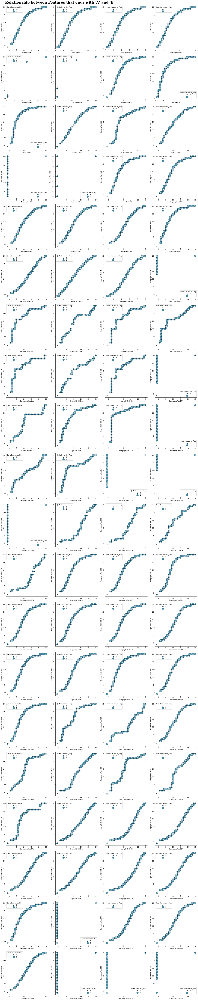

In [ ]:
# Plotting scatter plots between the ordinal pairs to check for any relationship between them along with the target variable

fig, axs = plt.subplots(int(len(l)/(2*4)), 4, figsize=(20,100))

fig.text(0.028, 1, "Relationship between Features that ends with \'A\' and \'B\'", fontsize=25, fontweight=600, fontfamily='serif')

idx=0
for i in range(0,int(len(l)/(2*4))):
    for j in range(0,4):
        sns.scatterplot(data=df_tr, x=l[idx], y=l[idx+1], hue='QuoteConversion_Flag', size='QuoteConversion_Flag', sizes=(200,50), palette=['#1C3D52', '#3E849E'], ax=axs[i,j])
        sns.despine() # This line removes the axis lines from top and right
        idx=idx+2

fig.tight_layout()

plt.show()

> * We cannot establish a relationship between the features and the target variable, but a number of plots above are monotonically increasing. Also a lot of datapoints in many of the plots shows that both the features have equal values for those datapoints.
> * **FEATURE ENGINEERING:** We create a new column and add the count of all column pairs where both the features values are equal. We need to exclude **-1** from above operation as **-1** only denotes missing data 

In [ ]:
def same_val_cal(df,l):
    
    '''This function takes a dataframe and list of column names as inputs and returns an array of length 
    equal to number of datapoints in the dataset. Each value of the array stores the number of column 
    pairs where the feature values are equal.'''
    
    same_val = np.zeros(len(df), dtype=int)

    for i in range(0, len(l),2):
        df_tmp = df[df[l[i]] == df[l[i+1]]][df[l[i]] != (-1)][[l[i], l[i+1]]]
        for j in df_tmp.index:
            same_val[j]+=1

    return same_val

In [ ]:
df_tr['#_Same_Val'] = same_val_cal(df_tr, l) # Calculating count of all column pairs where both feature values are equal for Train dataset
df_te['#_Same_Val'] = same_val_cal(df_te, l1) # Calculating count of all column pairs where both feature values are equal for Test dataset

In [ ]:
df_tr[['#_Same_Val']].head()

,#_Same_Val
0,11
1,6
2,5
3,10
4,10


In [ ]:
df_te[['#_Same_Val']].head()

,#_Same_Val
0,16
1,6
2,4
3,9
4,9


<h3>Updating df_tr_col_summary and df_te_col_summary</h3>

In [ ]:
df_tr_col_summary=col_sum(df_tr)
df_te_col_summary=col_sum(df_te)

<h3> State Wise distribution of Target variable </h3>

> * **'GeographicField64'** is a column with State codes from 4 states - **Texas**, **New Jersey**, **Illinois** and **California**. We need to check whether there is any relation between US States where quotes were made and conversion of the quote

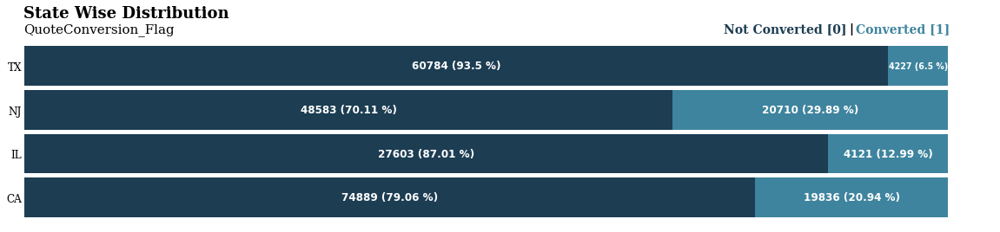

In [ ]:
# https://www.kaggle.com/code/joshuaswords/netflix-data-visualization/notebook
# Plotting Dstribution of Quote Conversions w.r.t U.S States

st=df_tr.groupby('GeographicField64')['QuoteConversion_Flag'].value_counts().unstack()
st['0_%']=(st[0]*100/(st[0]+st[1])).apply(lambda x: np.round(x,2)) # Percentage of unconverted quotes
st['1_%']=(st[1]*100/(st[0]+st[1])).apply(lambda x: np.round(x,2)) # Percentage of converted quotes

fig, ax = plt.subplots(1,1, figsize=(20,4))

fig.text(0.124, 0.96, 'State Wise Distribution', fontsize=18, fontweight=600, fontfamily='serif')
fig.text(0.124, 0.90, 'QuoteConversion_Flag', fontsize=15, fontweight=500, fontfamily='serif')

ax.barh(st.index, st['0_%'], height=0.9, color='#1C3D52')
ax.barh(st.index, st['1_%'], left=st['0_%'], height=0.9, color='#3E849E')

for i in enumerate(st['0_%']):
    ax.annotate("{0} ({1} %)".format(st[0].iloc[i[0]], i[1]), xy=(i[1]/2, i[0]), ha='center', va='center', fontfamily='sans-serif', fontsize=12, fontweight=600, color='white')

for i in enumerate(st['1_%']):
    if (i[0]==3): # This is done to accomodate the text inside the block
        fnt=9.5
    else:
        fnt=12
    ax.annotate("{0} ({1} %)".format(st[1].iloc[i[0]], i[1]), xy=(st['0_%'].iloc[i[0]]+i[1]/2, i[0]), ha='center', va='center', fontfamily='sans-serif', fontsize=fnt, fontweight=600, color='white')
    
ax.set_xticks([])
ax.set_yticklabels(st.index, fontfamily='serif', fontsize=12)
ax.tick_params(axis='y', length=0)

# The axis lines from top, left, right and bottom are removed
for s in ['top', 'left', 'right', 'bottom']:
    ax.spines[s].set_visible(False)

fig.text(0.684, 0.90, 'Not Converted [0]', fontsize=14, fontweight=600, color='#1C3D52', fontfamily='serif')
fig.text(0.784, 0.90, '|', fontsize=14, fontweight=600, color='black')
fig.text(0.789, 0.90, 'Converted [1]', fontsize=14, fontweight=600, color='#3E849E', fontfamily='serif')

plt.show()

> * From the above plot, we can see **New Jersey** has the highest rate of Quote Conversion followed by **California**, **Illinois** and **Texas**
> * Also, **California** tops in total number of Quotes followed by **New Jersey**, **Texas** and **Illinois**

<h3> Train Test Split </h3>

In [ ]:
y_true = df_tr['QuoteConversion_Flag'].values
data = df_tr.drop(['QuoteNumber'], axis=1)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(data, y_true, stratify = y_true, test_size = 0.25)

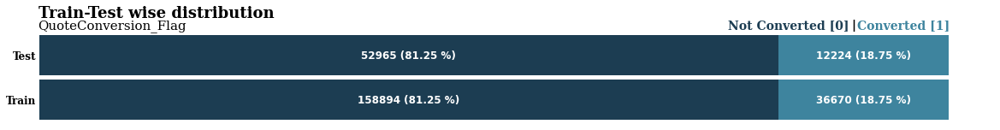

In [ ]:
# Plotting distribution of Train and Test Datapoints after splitting as per the target variable

tr_dist = Counter(y_train)
te_dist = Counter(y_test)

y_dist = [tr_dist, te_dist]

zero = list([np.round((tr_dist[0]*100)/(tr_dist[0]+tr_dist[1]),2), np.round((te_dist[0]*100)/(te_dist[0]+te_dist[1]),2)])
one = list([np.round((tr_dist[1]*100)/(tr_dist[0]+tr_dist[1]),2), np.round((te_dist[1]*100)/(te_dist[0]+te_dist[1]),2)])

fig, ax = plt.subplots(1,1, figsize=(20,2))

fig.text(0.124, 0.99, 'Train-Test wise distribution', fontsize=18, fontweight=600, fontfamily='serif')
fig.text(0.124, 0.90, 'QuoteConversion_Flag', fontsize=15, fontweight=500, fontfamily='serif')

ax.barh([0, 1], zero, height=0.9, color='#1C3D52')
ax.barh([0, 1], one, left=zero, height=0.9, color='#3E849E')

# Annotation of the bars
for i in enumerate(zero):
    ax.annotate("{0} ({1} %)".format(y_dist[i[0]][0], i[1]), xy=(i[1]/2, i[0]), ha='center', va='center', fontfamily='sans-serif', fontsize=12, fontweight=600, color='white')

for i in enumerate(one):
    ax.annotate("{0} ({1} %)".format(y_dist[i[0]][1], i[1]), xy=(81.25+i[1]/2, i[0]), ha='center', va='center', fontfamily='sans-serif', fontsize=12, fontweight=600, color='white')
    
plt.xticks([])
plt.yticks([0, 1], ['Train', 'Test'], fontfamily='serif', fontsize=12, fontweight=600)
ax.tick_params(axis='y', length=0)

# The axis lines from top, left, right and bottom are removed
for s in ['top', 'left', 'right', 'bottom']:
    ax.spines[s].set_visible(False)

fig.text(0.684, 0.90, 'Not Converted [0]', fontsize=14, fontweight=600, color='#1C3D52', fontfamily='serif')
fig.text(0.784, 0.90, '|', fontsize=14, fontweight=600, color='black')
fig.text(0.789, 0.90, 'Converted [1]', fontsize=14, fontweight=600, color='#3E849E', fontfamily='serif')

plt.show()

<h3> Feature Engineering based on correlation of features w.r.t target variable</h3>

In [ ]:
X_train.corr().abs().sort_values(by=['QuoteConversion_Flag'], ascending=False)['QuoteConversion_Flag']

QuoteConversion_Flag    1.000000
SalesField5             0.350915
PropertyField29         0.263052
SalesField1B            0.252817
PersonalField9          0.251792
SalesField4             0.217431
SalesField1A            0.216886
PropertyField35         0.187363
Field10                 0.185455
SalesField2B            0.185008
GeographicField11A      0.181603
Field9                  0.180941
GeographicField9A       0.178000
GeographicField6A       0.177787
PersonalField13         0.177364
GeographicField13A      0.177018
GeographicField8A       0.175814
SalesField2A            0.175680
PersonalField12         0.171997
CoverageField11B        0.171106
GeographicField12A      0.168648
Affirmations            0.166293
Negations               0.164962
GeographicField20A      0.164239
GeographicField7A       0.163274
GeographicField16A      0.160373
GeographicField15A      0.158400
CoverageField6B         0.154565
GeographicField14B      0.139742
GeographicField7B       0.137093
Field7    

> * We can see that **SalesField5**, **SalesField1B** and **PersonalField9** have high correlation values w.r.t the target variable. So we create new features with values equal to conversion rate for that particular value in the above three features
> * We have left **PropertyField29** since it had too many null values that we imputed with -1

In [ ]:
# Feature Engineering involving 'SalesField5'

X_tmp=X_train[['SalesField5', 'QuoteConversion_Flag']].value_counts().unstack()
X_tmp.fillna(0, inplace=True)
X_tmp['Conv_Rate']=X_tmp[1]/(X_tmp[0]+X_tmp[1])
X_tmp

QuoteConversion_Flag,0,1,Conv_Rate
SalesField5,,,
1,1.0,0.0,0.000000
2,7006.0,2535.0,0.265695
3,29039.0,18581.0,0.390193
4,17850.0,9856.0,0.355735
5,104998.0,5698.0,0.051474


In [ ]:
dct={}
for i in X_tmp.index:
    dct[i]=X_tmp.loc[i]['Conv_Rate']

In [ ]:
dct

{1: 0.0,
 2: 0.26569541976732,
 3: 0.3901931961360773,
 4: 0.3557352198079838,
 5: 0.051474308014743}

In [ ]:
dct[X_train['SalesField5'].mode().values[0]] # this value will be used if any unseen feature value appears in test data

0.051474308014743

In [ ]:
def fe1(X, X_train, dct):

    '''This function takes a dataframe, X_train and the dictionary with conversion rates as values
    as inputs and return the dataframe and list of values equal to the conversion rate of the corresponding feature 
    value of SalesField5'''

    l=[]
    for i in X.index:
        row=X.loc[i]
        v=row['SalesField5']
        w=dct.get(v, dct[X_train['SalesField5'].mode().values[0]])
        if v not in dct.keys():
            X['SalesField5'].loc[i]=X_train['SalesField5'].mode().values[0]
        l.append(w)
    return X, l

In [ ]:
X_train, l=fe1(X_train, X_train, dct)
X_train['SF5_FE']=l
X_test, l=fe1(X_test, X_train, dct)
X_test['SF5_FE']=l
df_te, l=fe1(df_te, X_train, dct)
df_te['SF5_FE']=l

In [ ]:
# Feature Engineering involving 'SalesField1B'

g=X_train.groupby('SalesField1B')
dct={}
for grp, grp_df in g:
    vc=grp_df['QuoteConversion_Flag'].value_counts()
    dct[grp]=vc[1]/(vc[0]+vc[1])

In [ ]:
dct

{1: 0.3511008111239861,
 2: 0.3340628218331617,
 3: 0.3351449275362319,
 4: 0.3051461080941298,
 5: 0.3030532424930608,
 6: 0.2667259108797765,
 7: 0.270517877592569,
 8: 0.2418804498925818,
 9: 0.241619391438886,
 10: 0.2249016372636121,
 11: 0.2241925269157694,
 12: 0.2024830410853705,
 13: 0.2015306122448979,
 14: 0.176887987835783,
 15: 0.1638308842485176,
 16: 0.1578345406023637,
 17: 0.1353364149974319,
 18: 0.120850622406639,
 19: 0.1168139293139293,
 20: 0.0887137773258769,
 21: 0.0796944621260343,
 22: 0.0652201659221442,
 23: 0.0418788187372708,
 24: 0.0278884462151394,
 25: 0.0129130269654386}

In [ ]:
dct[X_train['SalesField1B'].mode().values[0]] # this value will be used if any unseen feature value appears in test data

0.3030532424930608

In [ ]:
def fe2(X, X_train, dct):

    '''This function takes a dataframe, X_train and the dictionary with conversion rates as values
    as inputs and return the dataframe and list of values equal to the conversion rate of the corresponding feature 
    value of SalesField1B'''

    l=[]
    for i in X.index:
        row=X.loc[i]
        v=row['SalesField1B']
        w=dct.get(v, dct[X_train['SalesField1B'].mode().values[0]])
        if v not in dct.keys():
            X['SalesField1B'].loc[i]=X_train['SalesField1B'].mode().values[0]
        l.append(w)
    return X, l

In [ ]:
X_train, l=fe2(X_train, X_train, dct)
X_train['SF1B_FE']=l
X_test, l=fe2(X_test, X_train, dct)
X_test['SF1B_FE']=l
df_te, l=fe2(df_te, X_train, dct)
df_te['SF1B_FE']=l

In [ ]:
# Feature Engineering involving 'PersonalField9'

g=X_train.groupby('PersonalField9')
dct={}
for grp, grp_df in g:
    vc=grp_df['QuoteConversion_Flag'].value_counts()
    dct[grp]=vc[1]/(vc[0]+vc[1])

In [ ]:
dct

{1: 0.3556792086203851, 2: 0.2278191704991822, 3: 0.0011659541391371}

In [ ]:
dct[X_train['PersonalField9'].mode().values[0]] # this value will be used if any unseen feature value appears in test data

0.2278191704991822

In [ ]:
def fe3(X, X_train, dct):

    '''This function takes a dataframe, X_train and the dictionary with conversion rates as values
    as inputs and return the dataframe and list of values equal to the conversion rate of the corresponding feature 
    value of PersonalField9'''

    l=[]
    for i in X.index:
        row=X.loc[i]
        v=row['PersonalField9']
        w=dct.get(v, dct[X_train['PersonalField9'].mode().values[0]])
        if v not in dct.keys():
            X['PersonalField9'].loc[i]=X_train['PersonalField9'].mode().values[0]
        l.append(w)
    return X, l

In [ ]:
X_train, l=fe3(X_train, X_train, dct)
X_train['PF9_FE']=l
X_test, l=fe3(X_test, X_train, dct)
X_test['PF9_FE']=l
df_te, l=fe3(df_te, X_train, dct)
df_te['PF9_FE']=l

# Pre-Modelling

<h3> Encoding of Categorical Features </h3>

In [ ]:
# Encoding Categorical Features using LabelEncoder

X_tr_temp = X_train.select_dtypes(include='object').apply(lambda x: x.unique(), axis=0).reset_index().set_index('index')
X_te_temp = X_test.select_dtypes(include='object').apply(lambda x: x.unique(), axis=0).reset_index().set_index('index')
df_te_temp = df_te.select_dtypes(include='object').apply(lambda x: x.unique(), axis=0).reset_index().set_index('index')

le = LabelEncoder()
dct={} # dct will have feature names as keys and unique elements of the features as values
dct_mode={} # dct_mode will have feature names  as keys and mode of the feature in training data as values

for i in enumerate(X_tr_temp.index):

    xtr = X_tr_temp.iloc[i[0]][0]
    xte = X_te_temp.iloc[i[0]][0]
    dfte = df_te_temp.iloc[i[0]][0]

    md=X_train[i[1]].mode()[0]

    et=np.setdiff1d(xte,xtr) # All elements which are present in the X_test dataset's feature but not in X_train dataset's feature
    for j in et:
        X_test[i[1]]=X_test[i[1]].replace(j, md) # All the extra elements in X_test dataset's feature are replaced with element which has highest frequency in the corresponding X_train dataset's feature
    
    et=np.setdiff1d(dfte,xtr) # All elements which are present in the df_te dataset's feature but not in X_train dataset's feature
    for j in et:
        df_te[i[1]]=df_te[i[1]].replace(j, md) # All the extra elements in df_te dataset's feature are replaced with element which has highest frequency in the corresponding X_train dataset's feature
    
    le.fit(xtr)
    dct[i[1]]=list(le.classes_)
    dct_mode[i[1]]=md

    X_train[i[1]] = le.transform(list(X_train[i[1]].values))
    X_test[i[1]] = le.transform(list(X_test[i[1]].values))
    df_te[i[1]] = le.transform(list(df_te[i[1]].values))

In [ ]:
joblib.dump(dct, '/content/drive/MyDrive/dct.pkl')
joblib.dump(dct_mode, '/content/drive/MyDrive/dct_mode.pkl')

<h3> Performing 2-way Feature Interactions</h3>

In [ ]:
y_train=X_train['QuoteConversion_Flag'].values
y_test=X_test['QuoteConversion_Flag'].values

qn_te=df_te['QuoteNumber'].values

In [ ]:
X_train.drop(['QuoteConversion_Flag'], axis=1, inplace=True)
X_test.drop(['QuoteConversion_Flag'], axis=1, inplace=True)

df_te.drop(['QuoteNumber'], axis=1, inplace=True)

In [ ]:
l=[] # l will store all the pair of feature along with auc value which have interacted strongly
for i in range(len(X_train.columns)-1):

    for j in range(i+1,len(X_train.columns)):

        # X_temp_tr stores the two interacting features and the interacted feature of X_train
        X_temp_tr=pd.DataFrame({X_train.columns[i]: X_train[X_train.columns[i]], X_train.columns[j]: X_train[X_train.columns[j]], "FI_2W": X_train[X_train.columns[i]] - X_train[X_train.columns[j]]})
        X_temp_te=pd.DataFrame({"FI_2W": X_test[X_test.columns[i]] - X_test[X_test.columns[j]]})# X_temp_te stores only the interacted feature of X_test

        xgb_clf=xgb.XGBClassifier(tree_method='gpu_hist', n_jobs=-1, random_state=42)
        xgb_clf.fit(X_temp_tr, y_train)

        feat_imp=X_temp_tr.columns[np.flip(np.argsort(xgb_clf.feature_importances_))]

        #here if the feature importance of the interacted feature is the highest then we train the xgb classifier with the interacted feature
        #and if its auc score is more than 70 then only we store the information
        if feat_imp[0]=='FI_2W':
            
            xgb_clf.fit(pd.DataFrame(X_temp_tr['FI_2W']), y_train)
            auc=roc_auc_score(y_test, xgb_clf.predict_proba(X_temp_te)[:,1])
            
            if auc>0.70:
                a=(X_train.columns[i], X_train.columns[j], auc)
                l.append(a)

In [ ]:
df_top_feat_int=pd.DataFrame(l, columns=['Feature_1', 'Feature_2', 'AUC']).sort_values(by=['AUC'], ascending=False)

In [ ]:
df_top_feat_int.to_csv('df_top_feat_int.csv')
!cp df_top_feat_int.csv "drive/My Drive/"

In [ ]:
df_top_feat_int=pd.read_csv('/content/drive/MyDrive/df_top_feat_int.csv')

In [ ]:
# Here we add the top 58 interacting features in the X_train, X_test and df_te dataset

for i in df_top_feat_int.index[0:58]:
    row=df_top_feat_int.iloc[i]
    nm=row['Feature_1']+'-'+row['Feature_2'] # nm is the name of the interacting feature
    X_train[nm]=X_train[row['Feature_1']]-X_train[row['Feature_2']]
    X_test[nm]=X_test[row['Feature_1']]-X_test[row['Feature_2']]
    df_te[nm]=df_te[row['Feature_1']]-df_te[row['Feature_2']]

In [ ]:
# Although interaction between Quote_Weekday and SalesField7 doesn't come up in above computation but we add them for better results

nm='Quote_Weekday-SalesField7'
X_train[nm]=X_train['Quote_Weekday']-X_train['SalesField7']
X_test[nm]=X_test['Quote_Weekday']-X_test['SalesField7']
df_te[nm]=df_te['Quote_Weekday']-df_te['SalesField7']

In [ ]:
# Although interaction between SalesField4 and SalesField5 doesn't come up in above computation but we add them for better results

nm='SalesField4-SalesField5'
X_train[nm]=X_train['SalesField4']-X_train['SalesField5']
X_test[nm]=X_test['SalesField4']-X_test['SalesField5']
df_te[nm]=df_te['SalesField4']-df_te['SalesField5']

In [ ]:
# Although interaction between SalesField1A and SalesField1B doesn't come up in above computation but we add them for better results

nm='SalesField1A-SalesField1B'
X_train[nm]=X_train['SalesField1A']-X_train['SalesField1B']
X_test[nm]=X_test['SalesField1A']-X_test['SalesField1B']
df_te[nm]=df_te['SalesField1A']-df_te['SalesField1B']

<h3> Top 10 Important features </h3>

> * Here we will find the top 10 most important features from **Train** dataset.
> * We will use **'feature_importances_'** attribute from **XGBClassifier** to find the top 10 importanrt features
>* Default values of **XGBClassifier** is used

In [ ]:
feat_imp_model = xgb.XGBClassifier(random_state=42, tree_method='gpu_hist', n_jobs=-1)
feat_imp_model.fit(X_train, y_train)

importance = feat_imp_model.feature_importances_
imp_idx = np.argsort(importance)[-10:]

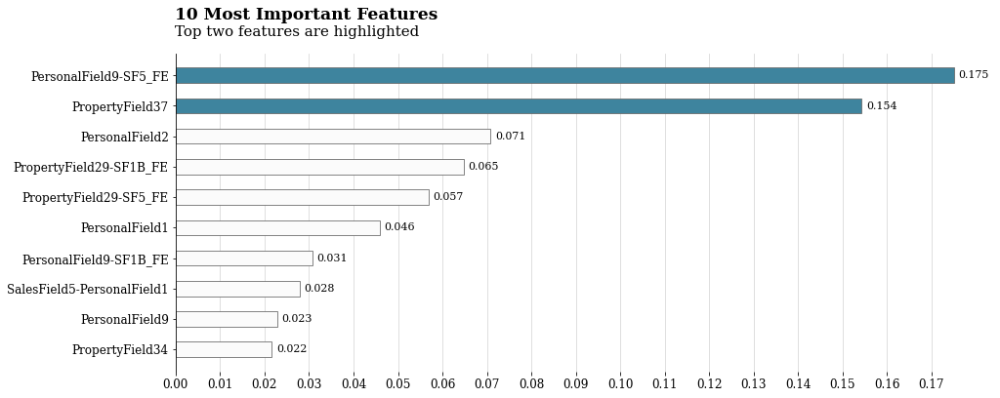

In [ ]:
8# https://www.kaggle.com/code/joshuaswords/netflix-data-visualization/notebook
# Plotting the top 10 important features based on their 'feature_importances_' values

fig, ax = plt.subplots(1,1, figsize = (15,6))

colormap=['#FBFBFB']*len(imp_idx)
colormap[-1]=colormap[-2]='#3E849E' # Top 2 features will be coloured in a different shade

fig.text(0.124, 0.96, '10 Most Important Features', fontsize=17, fontweight=600, fontfamily='serif')
fig.text(0.124, 0.92, 'Top two features are highlighted', fontsize=15, fontweight=500, fontfamily='serif')

ax.barh(range(len(imp_idx)), importance[imp_idx], height=0.5, linewidth=0.8, edgecolor='#686868', color=colormap)

for i, j in enumerate(importance[imp_idx]):
    ax.annotate("{:.3f}".format(j), xy=(j+0.001, i), va='center', fontfamily='serif', fontsize=11)

plt.yticks(list(range(len(imp_idx))), X_train.columns[imp_idx], fontfamily='serif', fontsize=12)
plt.xticks([x/100.0 for x in range(0,18)], fontfamily='serif', fontsize=12)

ax.grid(axis='x', alpha=0.5)
ax.set_axisbelow(True)

# The axis lines from top, left, right and bottom are removed
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)

plt.show()

> * **'PersonalField9-SF5_FE'** is the most important feature
> * **'PersonalField9-SF5_FE'** and **'PropertyField37'** have comparatively high importance values as compared to other features
> * **5** out of top **10** most important features are feature engineered. They are basically interacting features. **4** out of these **5** interacting features have one of the features engineered using correlation with the target variable

<h3> Data Visualization using TSNE </h3>

In [ ]:
x_5000 = X_train.iloc[:5000]
y_5000 = y_train[:5000]

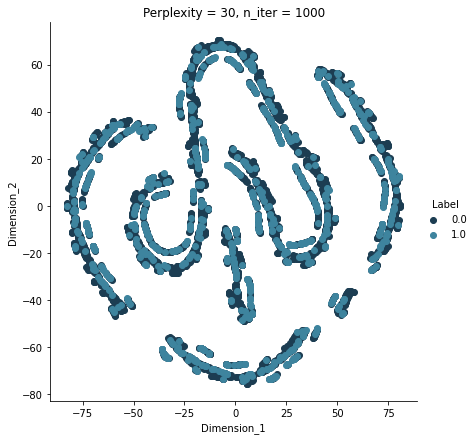

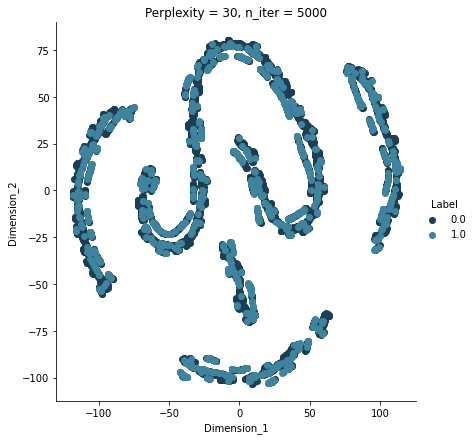

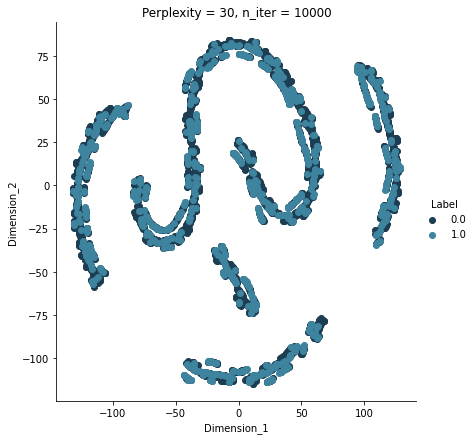

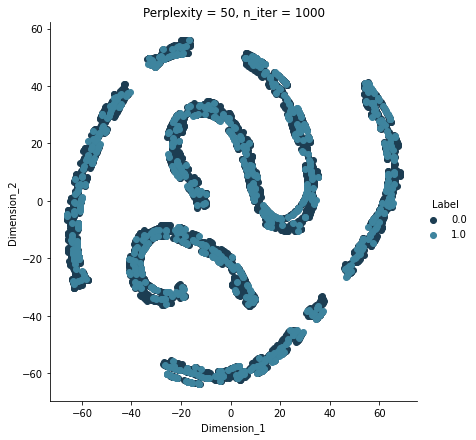

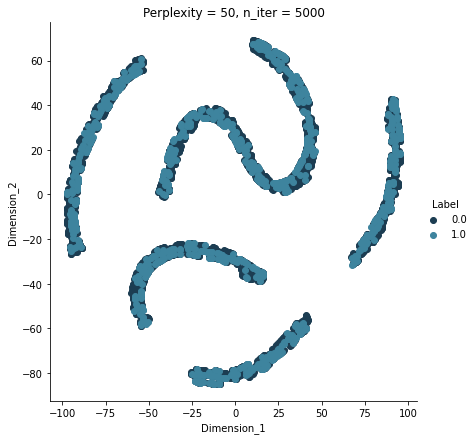

...

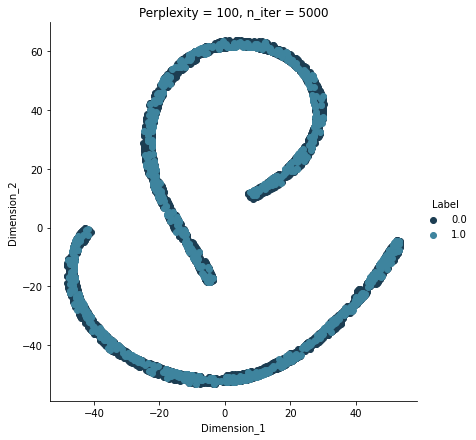

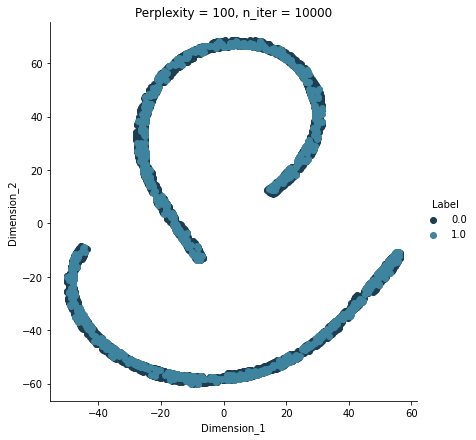

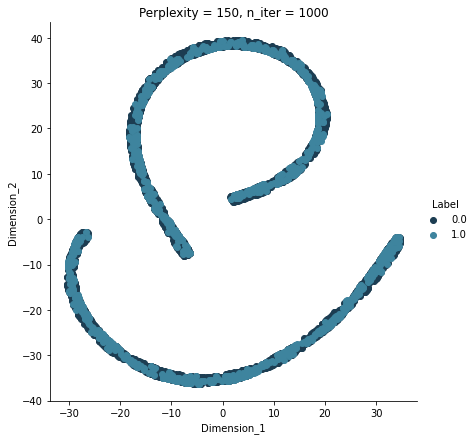

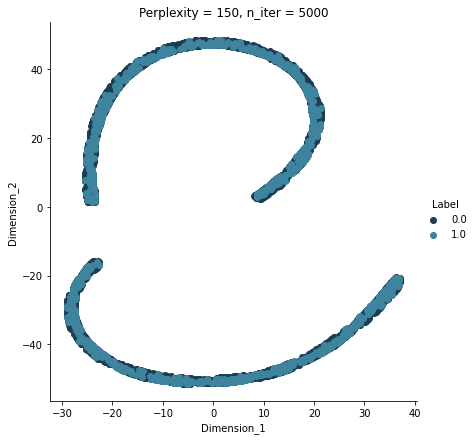

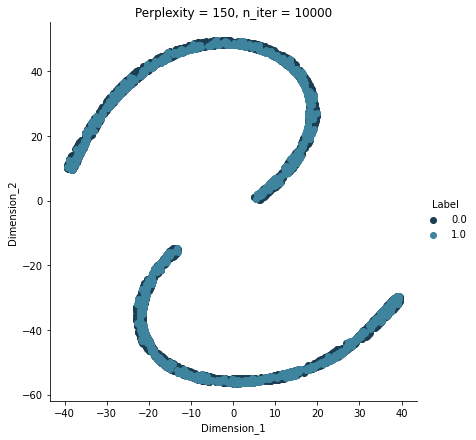

In [ ]:
for i in [30,50,75,100,150]: # For perplexity
    for j in [1000,5000,10000]: # For number of iterations
        
        model_tsne=TSNE(n_components=2, random_state=42, perplexity=i, n_iter=j)
        tsne_data = model_tsne.fit_transform(x_5000)

        tsne_data=np.vstack((tsne_data.T, y_5000)).T
        tsne_df = pd.DataFrame(data=tsne_data, columns=('Dimension_1', 'Dimension_2', 'Label'))

        sns.FacetGrid(tsne_df, hue='Label', size=6, palette=['#1C3D52', '#3E849E']).map(plt.scatter, 'Dimension_1', 'Dimension_2').add_legend()
        plt.title('Perplexity = {0}, n_iter = {1}'.format(i,j))
plt.show()

> * None of the plots are able to separate the two class labels properly
> * Although we get some sort of shapes from these plots

# Modelling

In [ ]:
# this function returns f1 score and predicted class labels on the best threshold

def f1(y_train, predicted_y_tr, y_test, predicted_y_te):

    '''This function takes actual target variable of X_train, predicted probablities class labels of X_train,
    actual target variable of X_test, predicted probablities class labels of X_test and returns the f1 score
    of both X_train and X_test dataset along with the predicted class labels'''

    prec, rec, thres=precision_recall_curve(y_train, predicted_y_tr[:,1])
    f_1=2*prec*rec/(prec+rec)
    th=thres[np.argmax(f_1)] # th will be the threshold with maximum f1 score
    f_1_tr=f_1.max() # f_1_tr is the f1 score of X_train on 'th' threshold

    pr_tr=[] # pr_tr will store the class labels of X_train on 'th' threshold
    for j in predicted_y_tr[:,1]:
        if j>=th:
            pr_tr.append(1)
        else:
            pr_tr.append(0)

    pr_te=[] # pr_te will store the class labels of X_test on 'th' threshold
    for j in predicted_y_te[:,1]:
        if j>=th:
            pr_te.append(1)
        else:
            pr_te.append(0)

    tp=0 # True Positive
    fp=0 # False Positive
    fn=0 # False Negative
    for k in zip(y_test, pr_te):
        if k[0]==1 and k[1]==1:
            tp+=1
        elif k[0]==0 and k[1]==1:
            fp+=1
        elif k[0]==1 and k[1]==0:
            fn+=1

    precision=(tp/(tp+fp+1))
    recall=(tp/(tp+fn+1))
    f_1_te=2*precision*recall/(precision+recall) # f_1_te is the f1 score of X_test on 'th' threshold

    return f_1_tr, f_1_te, pr_tr, pr_te, th

In [ ]:
# This function plots the confusion, precision and recall matrices given true labels and predicted labels

def plot_confusion_matrix(clf_txt, data_txt, true_y, predict_y):

    ''' This function takes name of the model, text denoting train or test data, target variable values
    and predicted values and plots the heat map of Confusion Matrix, Precision Matrix and Recall Matrix'''

    C = confusion_matrix(true_y, predict_y)
    
    A =(((C.T)/(C.sum(axis=1))).T) # Recall Matrix
    
    B =(C/C.sum(axis=0)) # Precision Matrix

    fig, axs = plt.subplots(1, 3, figsize=(20,4))
    
    fig.text(0.495, 1.06, clf_txt, ha='center', fontsize=18, fontweight=600, fontfamily='serif')
    fig.text(0.495, 0.99, data_txt, ha='center', fontsize=17, fontweight=500, fontfamily='serif')

    labels = [0,1]
    cmap=matplotlib.colors.LinearSegmentedColormap.from_list("", ['#3E849E', '#1C3D52'])

    # representing Confusion Matrix in heatmap format
    sns.heatmap(C, annot=True, cmap=cmap, fmt='g', cbar=True, linewidth=2.5, xticklabels=labels, yticklabels=labels, annot_kws={"fontsize":12, "fontweight":600}, ax=axs[0])
    axs[0].set_xlabel('Predicted Class', fontsize=12, fontfamily='serif')
    axs[0].set_ylabel('Original Class', fontsize=12, fontfamily='serif')
    axs[0].set_title("Confusion matrix", fontsize=14, fontfamily='serif')
    
    # representing Precision Matrix in heatmap format
    sns.heatmap(B, annot=True, cmap=cmap, vmin=0.0, vmax=1.0, linewidth=2.5, xticklabels=labels, yticklabels=labels, annot_kws={"fontsize":12, "fontweight":600}, ax=axs[1])
    axs[1].set_xlabel('Predicted Class', fontsize=12, fontfamily='serif')
    axs[1].set_ylabel('Original Class', fontsize=12, fontfamily='serif')
    axs[1].set_title("Precision matrix", fontsize=14, fontfamily='serif')
    
    # representing Recall Matrix in heatmap format
    sns.heatmap(A, annot=True, cmap=cmap, vmin=0.0, vmax=1.0, linewidth=2.5, xticklabels=labels, yticklabels=labels, annot_kws={"fontsize":12, "fontweight":600}, ax=axs[2])
    axs[2].set_xlabel('Predicted Class', fontsize=12, fontfamily='serif')
    axs[2].set_ylabel('Original Class', fontsize=12, fontfamily='serif')
    axs[2].set_title("Recall matrix", fontsize=14, fontfamily='serif')
    
    plt.show()

In [ ]:
# plot roc curve and precision-recall curve

def auc_f1_curve(y_true, predicted_y):

    ''' This function takes target variable values and the predicted probablities of class label 1 as input
    and plots the ROC Curve and Precision-Recall Curve from it'''

    fig, axs = plt.subplots(1,2, figsize=(15,6))

    RocCurveDisplay.from_predictions(y_true, predicted_y, ax=axs[0], color='#1C3D52') # Plots the ROC Curve

    axs[0].spines['top'].set_visible(False)
    axs[0].spines['right'].set_visible(False)

    axs[0].grid(axis='both', alpha=0.5)
    axs[0].set_axisbelow(True)

    axs[0].set_title("ROC - AUC Curve", fontweight='500')

    PrecisionRecallDisplay.from_predictions(y_true, predicted_y, ax=axs[1], color='#1C3D52') # Plots the Precision-Recall Curve

    axs[1].spines['top'].set_visible(False)
    axs[1].spines['right'].set_visible(False)

    axs[1].grid(axis='both', alpha=0.5)
    axs[1].set_axisbelow(True)

    axs[1].set_title("Precision - Recall Curve", fontweight='500')

    fig.subplots_adjust(wspace=0.2)

    plt.show()

<h3> Random Model </h3>

In [ ]:
# Here we generate an array of random values between 0 and 1 as the predicted test values 
# and use its performance metric as a benchmark for other models

test_len=len(y_test)
predicted_y = np.zeros((test_len,2))

for i in range(test_len):
    rand_probs = np.random.rand(1,2)
    predicted_y[i] = ((rand_probs/sum(sum(rand_probs)))[0])

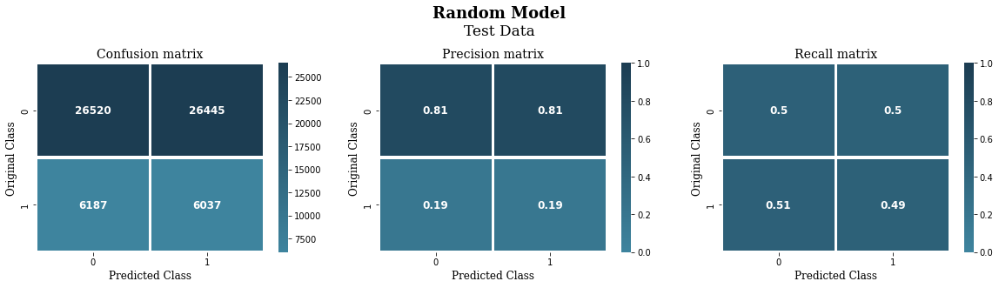

In [ ]:
plot_confusion_matrix("Random Model", "Test Data", y_test, np.argmax(predicted_y, axis=1))

AUC Score on Test Data using Random Model: 0.49871
F1 Score on Test Data using Random Model: 0.27008


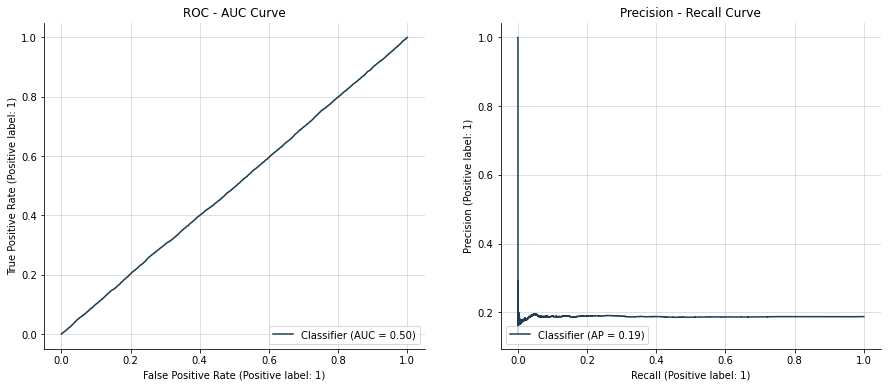

In [ ]:
print("\033[1mAUC Score\033[0m on \033[1mTest Data\033[0m using \033[1mRandom Model\033[0m: \033[1m{:.5f}\033[0m".format(roc_auc_score(y_test, predicted_y[:,1])))
print("\033[1mF1 Score\033[0m on \033[1mTest Data\033[0m using \033[1mRandom Model\033[0m: \033[1m{:.5f}\033[0m".format(f1_score(y_test, np.argmax(predicted_y, axis=1))))

auc_f1_curve(y_test, predicted_y[:,1])

<h3> Logistic Regression </h3>

In [ ]:
# Here we use LogisticRegression Classifier from Sklearn to build a Logistic Regression model
# We perform hyperparameter tuning to find the best hyperparameter and then train the model with those hyperparameter

param={'C':[10**-5, 10**-3, 10**-2, 10**-1, 10**1, 10**3, 10**5]}

lr=LogisticRegression(random_state=42, n_jobs=-1)

model = GridSearchCV(lr, param, scoring='roc_auc', cv=3, return_train_score=True, verbose=4)
model.fit(X_train, y_train)

Fitting 3 folds for each of 7 candidates, totalling 21 fits
[CV 1/3] END .......C=1e-05;, score=(train=0.805, test=0.803) total time= 1.3min
[CV 2/3] END .......C=1e-05;, score=(train=0.804, test=0.804) total time= 1.4min
[CV 3/3] END .......C=1e-05;, score=(train=0.800, test=0.800) total time= 1.4min
[CV 1/3] END .......C=0.001;, score=(train=0.810, test=0.808) total time= 1.5min
[CV 2/3] END .......C=0.001;, score=(train=0.796, test=0.797) total time= 1.5min
[CV 3/3] END .......C=0.001;, score=(train=0.818, test=0.818) total time= 1.5min
[CV 1/3] END ........C=0.01;, score=(train=0.810, test=0.808) total time= 1.5min
[CV 2/3] END ........C=0.01;, score=(train=0.798, test=0.799) total time= 1.5min
[CV 3/3] END ........C=0.01;, score=(train=0.810, test=0.810) total time= 1.5min
[CV 1/3] END .........C=0.1;, score=(train=0.798, test=0.795) total time= 1.4min
[CV 2/3] END .........C=0.1;, score=(train=0.797, test=0.797) total time= 1.5min
[CV 3/3] END .........C=0.1;, score=(train=0.798,

GridSearchCV(cv=3, estimator=LogisticRegression(n_jobs=-1, random_state=42),
             param_grid={'C': [1e-05, 0.001, 0.01, 0.1, 10, 1000, 100000]},
             return_train_score=True, scoring='roc_auc', verbose=4)

In [ ]:
lr=LogisticRegression(random_state=42, n_jobs=-1, C=model.best_params_['C'])

clb_clf_lr=CalibratedClassifierCV(lr, method='sigmoid', n_jobs=-1)
clb_clf_lr.fit(X_train, y_train)

CalibratedClassifierCV(base_estimator=LogisticRegression(C=0.001, n_jobs=-1,
                                                         random_state=42),
                       n_jobs=-1)

In [ ]:
predicted_y_tr = clb_clf_lr.predict_proba(X_train)
predicted_y_te = clb_clf_lr.predict_proba(X_test)

In [ ]:
f_1_tr, f_1_te, pr_tr, pr_te, th=f1(y_train, predicted_y_tr, y_test, predicted_y_te)

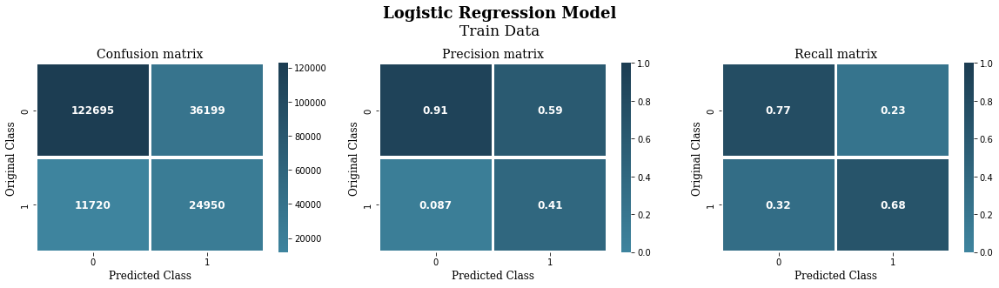

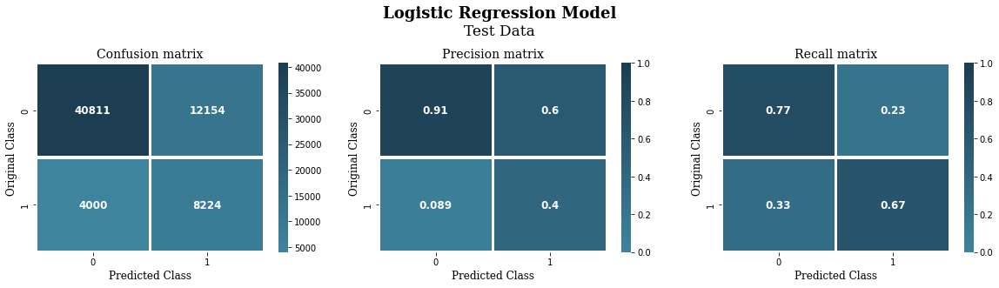

In [ ]:
plot_confusion_matrix("Logistic Regression Model", "Train Data", y_train, pr_tr)
plot_confusion_matrix("Logistic Regression Model", "Test Data", y_test, pr_te)

AUC Score on Train Data using Logistic Regression Model: 0.80575
F1 Score on Train Data using Logistic Regression Model: 0.51013


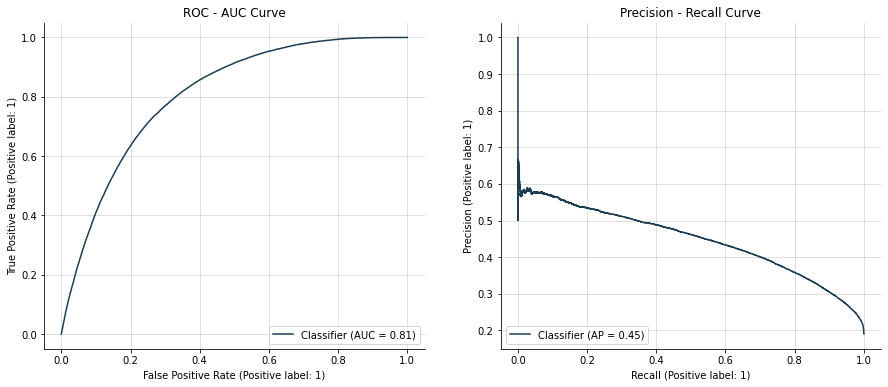

In [ ]:
print("\033[1mAUC Score\033[0m on \033[1mTrain Data\033[0m using \033[1mLogistic Regression Model\033[0m: \033[1m{:.5f}\033[0m".format(roc_auc_score(y_train, predicted_y_tr[:,1])))
print("\033[1mF1 Score\033[0m on \033[1mTrain Data\033[0m using \033[1mLogistic Regression Model\033[0m: \033[1m{:.5f}\033[0m".format(f_1_tr))

auc_f1_curve(y_train, predicted_y_tr[:,1])

AUC Score on Test Data using Logistic Regression Model: 0.80297
F1 Score on Test Data using Logistic Regression Model: 0.50448


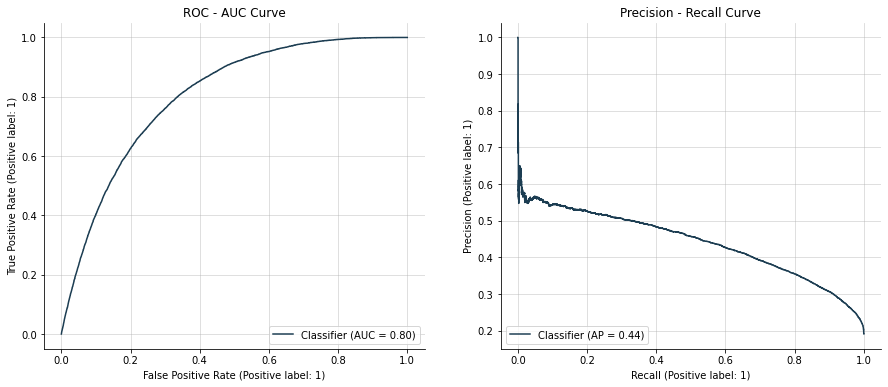

In [ ]:
print("\033[1mAUC Score\033[0m on \033[1mTest Data\033[0m using \033[1mLogistic Regression Model\033[0m: \033[1m{:.5f}\033[0m".format(roc_auc_score(y_test, predicted_y_te[:,1])))
print("\033[1mF1 Score\033[0m on \033[1mTest Data\033[0m using \033[1mLogistic Regression Model\033[0m: \033[1m{:.5f}\033[0m".format(f_1_te))

auc_f1_curve(y_test, predicted_y_te[:,1])

<h5> Prediction on Unseen Test Data for Kaggle Score </h5>

In [ ]:
predicted_y_te = clb_clf_lr.predict_proba(df_te)[:,1]

In [ ]:
df_res=pd.DataFrame({'QuoteNumber': qn_te,
             'QuoteConversion_Flag': predicted_y_te})

In [ ]:
df_res.to_csv("lr_result.csv", index=False)
!cp lr_result.csv "drive/My Drive/"

<h3> SVM Model </h3>

In [ ]:
# Here we use SGD Classifier from Sklearn to build a SVM model
# We perform hyperparameter tuning to find the best hyperparameter and then train the model with those hyperparameter

param={'alpha':[10**-7, 10**-5, 10**-3, 10**-1, 10**1, 10**3]}

sgd_clf_svm = SGDClassifier(loss='hinge', penalty='l1', random_state=42)

model = GridSearchCV(sgd_clf_svm, param, scoring='roc_auc', cv=3, return_train_score=True, verbose=4)
model.fit(X_train, y_train)

Fitting 3 folds for each of 6 candidates, totalling 18 fits
[CV 1/3] END ...alpha=1e-07;, score=(train=0.811, test=0.808) total time= 2.2min
[CV 2/3] END ...alpha=1e-07;, score=(train=0.823, test=0.824) total time= 2.4min
[CV 3/3] END ...alpha=1e-07;, score=(train=0.812, test=0.811) total time= 2.3min
[CV 1/3] END ...alpha=1e-05;, score=(train=0.805, test=0.802) total time= 2.4min
[CV 2/3] END ...alpha=1e-05;, score=(train=0.788, test=0.789) total time= 1.8min
[CV 3/3] END ...alpha=1e-05;, score=(train=0.807, test=0.807) total time= 2.2min
[CV 1/3] END ...alpha=0.001;, score=(train=0.801, test=0.798) total time= 3.3min
[CV 2/3] END ...alpha=0.001;, score=(train=0.794, test=0.794) total time= 1.9min
[CV 3/3] END ...alpha=0.001;, score=(train=0.790, test=0.792) total time= 1.5min
[CV 1/3] END .....alpha=0.1;, score=(train=0.738, test=0.735) total time= 3.4min
[CV 2/3] END .....alpha=0.1;, score=(train=0.692, test=0.688) total time=  11.6s
[CV 3/3] END .....alpha=0.1;, score=(train=0.749,

GridSearchCV(cv=3, estimator=SGDClassifier(penalty='l1', random_state=42),
             param_grid={'alpha': [1e-07, 1e-05, 0.001, 0.1, 10, 1000]},
             return_train_score=True, scoring='roc_auc', verbose=4)

In [ ]:
sgd_clf_svm = SGDClassifier(alpha=model.best_params_['alpha'], loss='hinge', penalty='l1', random_state=42)

clb_clf_svm=CalibratedClassifierCV(sgd_clf_svm, method='isotonic', n_jobs=-1)
clb_clf_svm.fit(X_train, y_train)

CalibratedClassifierCV(base_estimator=SGDClassifier(alpha=1e-07, penalty='l1',
                                                    random_state=42),
                       method='isotonic', n_jobs=-1)

In [ ]:
predicted_y_tr = clb_clf_svm.predict_proba(X_train)
predicted_y_te = clb_clf_svm.predict_proba(X_test)

In [ ]:
f_1_tr, f_1_te, pr_tr, pr_te, th=f1(y_train, predicted_y_tr, y_test, predicted_y_te)

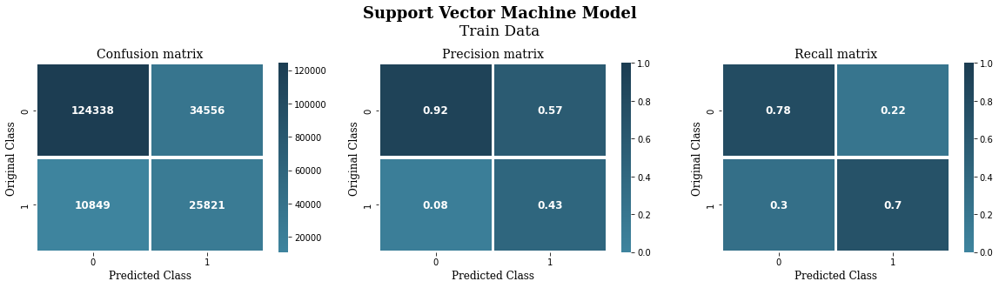

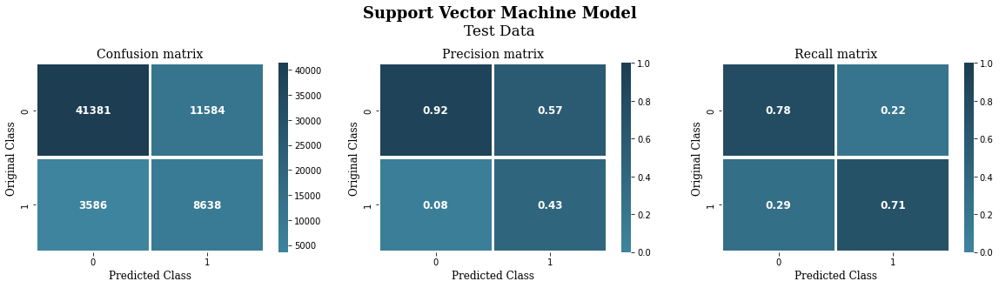

In [ ]:
plot_confusion_matrix("Support Vector Machine Model", "Train Data", y_train, pr_tr)
plot_confusion_matrix("Support Vector Machine Model", "Test Data", y_test, pr_te)

AUC Score on Train Data using Support Vector Machine Model: 0.82258
F1 Score on Train Data using Support Vector Machine Model: 0.53213


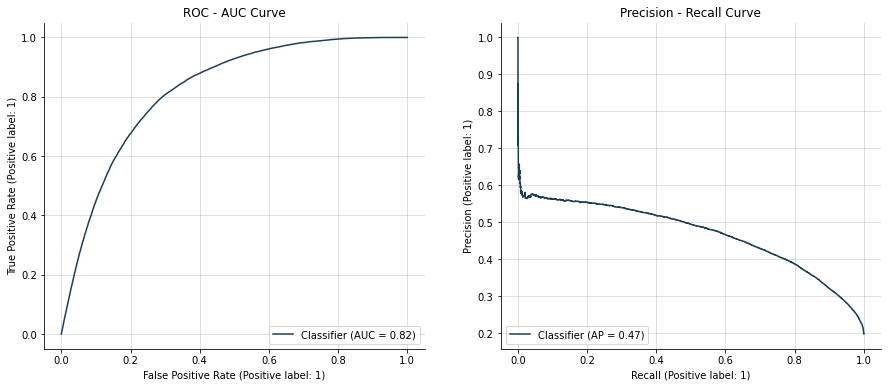

In [ ]:
print("\033[1mAUC Score\033[0m on \033[1mTrain Data\033[0m using \033[1mSupport Vector Machine Model\033[0m: \033[1m{:.5f}\033[0m".format(roc_auc_score(y_train, predicted_y_tr[:,1])))
print("\033[1mF1 Score\033[0m on \033[1mTrain Data\033[0m using \033[1mSupport Vector Machine Model\033[0m: \033[1m{:.5f}\033[0m".format(f_1_tr))

auc_f1_curve(y_train, predicted_y_tr[:,1])

AUC Score on Test Data using Support Vector Machine Model: 0.82048
F1 Score on Test Data using Support Vector Machine Model: 0.53242


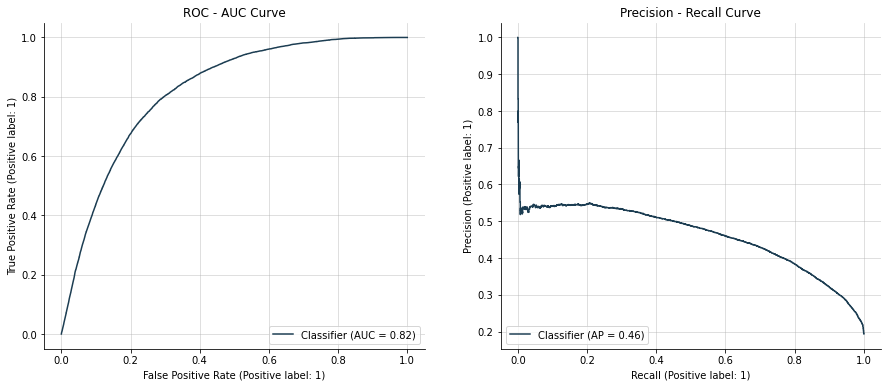

In [ ]:
print("\033[1mAUC Score\033[0m on \033[1mTest Data\033[0m using \033[1mSupport Vector Machine Model\033[0m: \033[1m{:.5f}\033[0m".format(roc_auc_score(y_test, predicted_y_te[:,1])))
print("\033[1mF1 Score\033[0m on \033[1mTest Data\033[0m using \033[1mSupport Vector Machine Model\033[0m: \033[1m{:.5f}\033[0m".format(f_1_te))

auc_f1_curve(y_test, predicted_y_te[:,1])

<h5> Prediction on Unseen Test Data for Kaggle Score </h5>

In [ ]:
predicted_y_te = clb_clf_svm.predict_proba(df_te)[:,1]

In [ ]:
df_res=pd.DataFrame({'QuoteNumber': qn_te,
             'QuoteConversion_Flag': predicted_y_te})

In [ ]:
df_res.to_csv("svm_result.csv", index=False)
!cp svm_result.csv "drive/My Drive/"

<h3> Decision Tree Classifier </h3>

In [ ]:
# Here we use Decision Tree Classifier from Sklearn to build a Decision Tree model
# We perform hyperparameter tuning to find the best hyperparameters and then train the model with those hyperparameters

param={'max_depth':[5, 10, 15, 20, 25]}

dt_clf = DecisionTreeClassifier(random_state=42)

model = GridSearchCV(dt_clf, param, scoring='roc_auc', cv=3, return_train_score=True, verbose=4)
model.fit(X_train, y_train)

Fitting 3 folds for each of 5 candidates, totalling 15 fits
[CV 1/3] END ...max_depth=5;, score=(train=0.941, test=0.939) total time=   4.9s
[CV 2/3] END ...max_depth=5;, score=(train=0.940, test=0.942) total time=   5.1s
[CV 3/3] END ...max_depth=5;, score=(train=0.942, test=0.940) total time=   4.8s
[CV 1/3] END ..max_depth=10;, score=(train=0.959, test=0.948) total time=   8.7s
[CV 2/3] END ..max_depth=10;, score=(train=0.959, test=0.951) total time=   8.4s
[CV 3/3] END ..max_depth=10;, score=(train=0.960, test=0.949) total time=   8.5s
[CV 1/3] END ..max_depth=15;, score=(train=0.975, test=0.919) total time=  11.8s
[CV 2/3] END ..max_depth=15;, score=(train=0.976, test=0.924) total time=  11.4s
[CV 3/3] END ..max_depth=15;, score=(train=0.977, test=0.921) total time=  11.5s
[CV 1/3] END ..max_depth=20;, score=(train=0.991, test=0.878) total time=  14.0s
[CV 2/3] END ..max_depth=20;, score=(train=0.992, test=0.878) total time=  14.2s
[CV 3/3] END ..max_depth=20;, score=(train=0.992,

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=42),
             param_grid={'max_depth': [5, 10, 15, 20, 25]},
             return_train_score=True, scoring='roc_auc', verbose=4)

In [ ]:
result= pd.DataFrame(model.cv_results_)

tr_auc=result['mean_train_score'].values
cv_auc=result['mean_test_score'].values
max_depth=result['param_max_depth'].values
tr_cv_diff=["{:.5f}".format(ti-ci) for ti,ci in zip(tr_auc, cv_auc)]
comp_df={"max_depth":max_depth, "tr_auc":tr_auc, "cv_auc":cv_auc, "train_cv_diff":tr_cv_diff}
df_tmp=pd.DataFrame(comp_df)
df_tmp.sort_values(by=['cv_auc'],ascending=False)

,max_depth,tr_auc,cv_auc,train_cv_diff
1,10,0.959166,0.949227,0.00994
0,5,0.941001,0.940325,0.00068
2,15,0.976004,0.921133,0.05487
3,20,0.991481,0.878940,0.11254
4,25,0.998483,0.842089,0.15639


In [ ]:
best_max_depth=10

In [ ]:
dt_clf = DecisionTreeClassifier(max_depth=best_max_depth, random_state=42)

clb_clf_dt=CalibratedClassifierCV(dt_clf, method='isotonic', n_jobs=-1)
clb_clf_dt.fit(X_train, y_train)

CalibratedClassifierCV(base_estimator=DecisionTreeClassifier(max_depth=10,
                                                             random_state=42),
                       method='isotonic', n_jobs=-1)

In [ ]:
predicted_y_tr = clb_clf_dt.predict_proba(X_train)
predicted_y_te = clb_clf_dt.predict_proba(X_test)

In [ ]:
f_1_tr, f_1_te, pr_tr, pr_te, th=f1(y_train, predicted_y_tr, y_test, predicted_y_te)

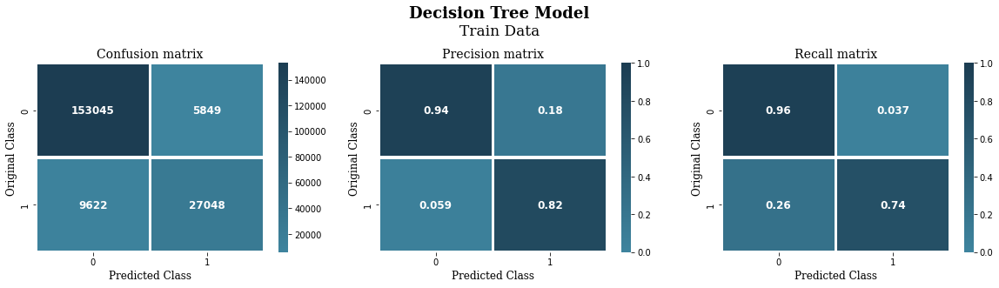

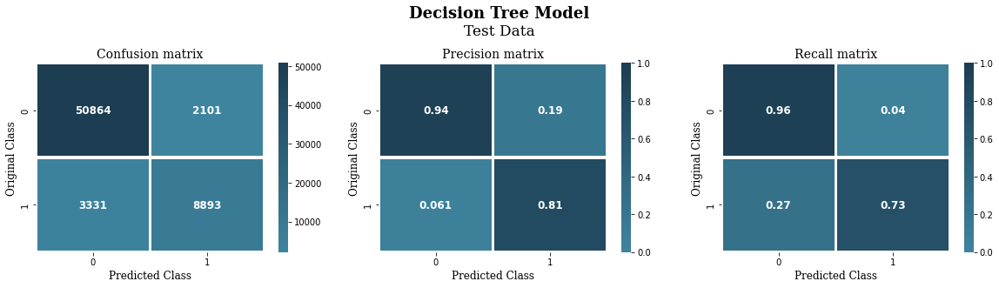

In [ ]:
plot_confusion_matrix("Decision Tree Model", "Train Data", y_train, pr_tr)
plot_confusion_matrix("Decision Tree Model", "Test Data", y_test, pr_te)

AUC Score on Train Data using Decision Tree Model: 0.96051
F1 Score on Train Data using Decision Tree Model: 0.77761


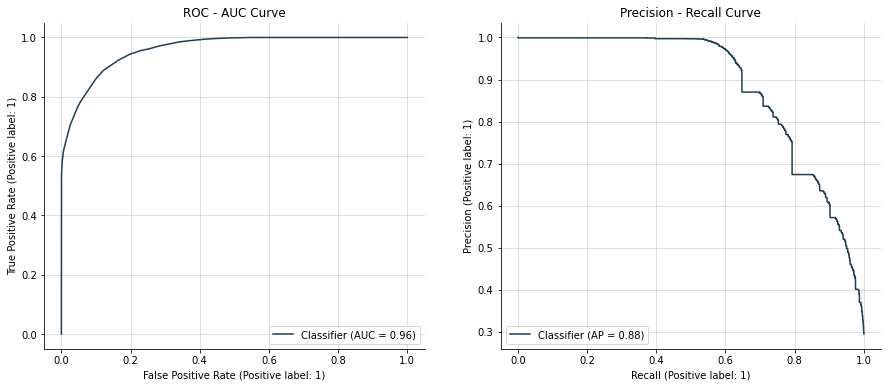

In [ ]:
print("\033[1mAUC Score\033[0m on \033[1mTrain Data\033[0m using \033[1mDecision Tree Model\033[0m: \033[1m{:.5f}\033[0m".format(roc_auc_score(y_train, predicted_y_tr[:,1])))
print("\033[1mF1 Score\033[0m on \033[1mTrain Data\033[0m using \033[1mDecision Tree Model\033[0m: \033[1m{:.5f}\033[0m".format(f_1_tr))

auc_f1_curve(y_train, predicted_y_tr[:,1])

AUC Score on Test Data using Decision Tree Model: 0.95607
F1 Score on Test Data using Decision Tree Model: 0.76598


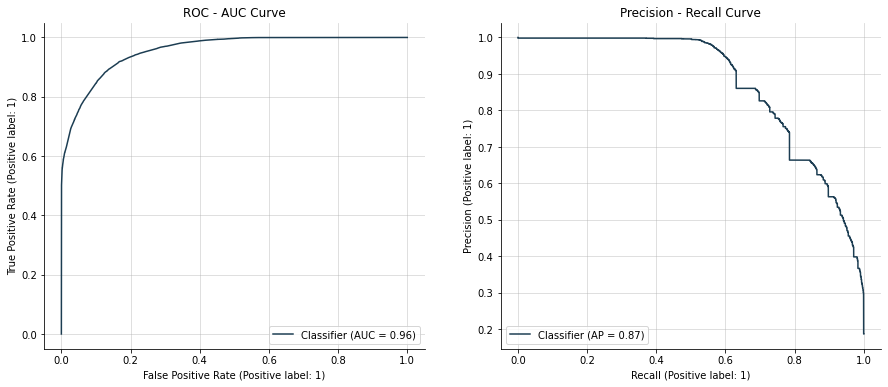

In [ ]:
print("\033[1mAUC Score\033[0m on \033[1mTest Data\033[0m using \033[1mDecision Tree Model\033[0m: \033[1m{:.5f}\033[0m".format(roc_auc_score(y_test, predicted_y_te[:,1])))
print("\033[1mF1 Score\033[0m on \033[1mTest Data\033[0m using \033[1mDecision Tree Model\033[0m: \033[1m{:.5f}\033[0m".format(f_1_te))

auc_f1_curve(y_test, predicted_y_te[:,1])

<h5> Prediction on Unseen Test Data for Kaggle Score </h5>

In [ ]:
predicted_y_te = clb_clf_dt.predict_proba(df_te)[:,1]

In [ ]:
df_res=pd.DataFrame({'QuoteNumber': qn_te,
             'QuoteConversion_Flag': predicted_y_te})

In [ ]:
df_res.to_csv("dt_result.csv", index=False)
!cp dt_result.csv "drive/My Drive/"

<h3> Random Forest DT Classifier </h3>

In [ ]:
param={'n_estimators': [5, 10, 20, 50, 70, 100], 'max_depth': [3,5,7,10,20]}

rf_clf = RandomForestClassifier(n_jobs=-1, random_state=42)

model = GridSearchCV(rf_clf, param, scoring='roc_auc', cv=3, return_train_score=True, verbose=4)
model.fit(X_train, y_train)

Fitting 3 folds for each of 30 candidates, totalling 90 fits
[CV 1/3] END max_depth=3, n_estimators=5;, score=(train=0.876, test=0.875) total time=   1.7s
[CV 2/3] END max_depth=3, n_estimators=5;, score=(train=0.877, test=0.879) total time=   1.1s
[CV 3/3] END max_depth=3, n_estimators=5;, score=(train=0.876, test=0.874) total time=   1.2s
[CV 1/3] END max_depth=3, n_estimators=10;, score=(train=0.888, test=0.886) total time=   1.4s
[CV 2/3] END max_depth=3, n_estimators=10;, score=(train=0.888, test=0.890) total time=   1.5s
[CV 3/3] END max_depth=3, n_estimators=10;, score=(train=0.892, test=0.891) total time=   1.7s
[CV 1/3] END max_depth=3, n_estimators=20;, score=(train=0.900, test=0.898) total time=   2.2s
[CV 2/3] END max_depth=3, n_estimators=20;, score=(train=0.899, test=0.901) total time=   1.9s
[CV 3/3] END max_depth=3, n_estimators=20;, score=(train=0.902, test=0.901) total time=   2.0s
[CV 1/3] END max_depth=3, n_estimators=50;, score=(train=0.897, test=0.895) total time=

GridSearchCV(cv=3, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             param_grid={'max_depth': [3, 5, 7, 10, 20],
                         'n_estimators': [5, 10, 20, 50, 70, 100]},
             return_train_score=True, scoring='roc_auc', verbose=4)

In [ ]:
result= pd.DataFrame(model.cv_results_)

tr_auc=result['mean_train_score'].values
cv_auc=result['mean_test_score'].values
n_estimators=result['param_n_estimators'].values
max_depth=result['param_max_depth'].values
tr_cv_diff=["{:.5f}".format(ti-ci) for ti,ci in zip(tr_auc, cv_auc)]
comp_df={"max_depth": max_depth, "n_estimators": n_estimators, "tr_auc":tr_auc, "cv_auc":cv_auc, "train_cv_diff":tr_cv_diff}
df_tmp=pd.DataFrame(comp_df)
df_tmp.sort_values(by=['cv_auc'],ascending=False)

,max_depth,n_estimators,tr_auc,cv_auc,train_cv_diff
29,20,100,0.998534,0.956769,0.04177
28,20,70,0.998423,0.956149,0.04227
27,20,50,0.998328,0.955484,0.04284
26,20,20,0.997385,0.951660,0.04573
23,10,100,0.955215,0.948175,0.00704
22,10,70,0.954647,0.947564,0.00708
21,10,50,0.954201,0.946964,0.00724
20,10,20,0.953239,0.946183,0.00706
25,20,10,0.996223,0.945441,0.05078
19,10,10,0.952160,0.944815,0.00734


In [ ]:
best_n_estimators=100
best_max_depth=10

In [ ]:
rf_clf = RandomForestClassifier(max_depth=best_max_depth, n_estimators=best_n_estimators, n_jobs=-1, random_state=42)

clb_clf_rf=CalibratedClassifierCV(rf_clf, method='isotonic', n_jobs=-1)
clb_clf_rf.fit(X_train, y_train)

CalibratedClassifierCV(base_estimator=RandomForestClassifier(max_depth=10,
                                                             n_jobs=-1,
                                                             random_state=42),
                       method='isotonic', n_jobs=-1)

In [ ]:
predicted_y_tr = clb_clf_rf.predict_proba(X_train)
predicted_y_te = clb_clf_rf.predict_proba(X_test)

In [ ]:
f_1_tr, f_1_te, pr_tr, pr_te, th=f1(y_train, predicted_y_tr, y_test, predicted_y_te)

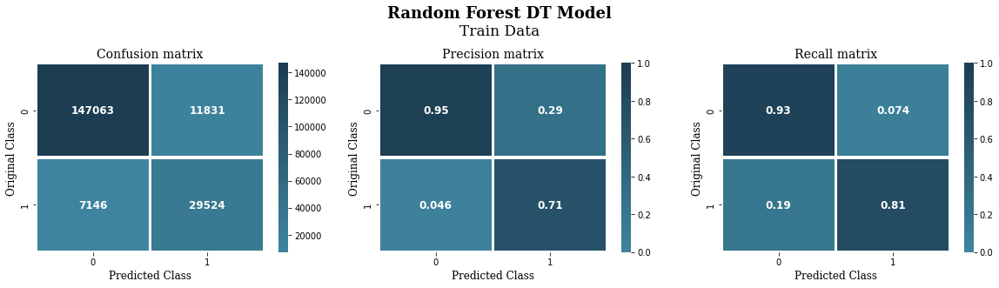

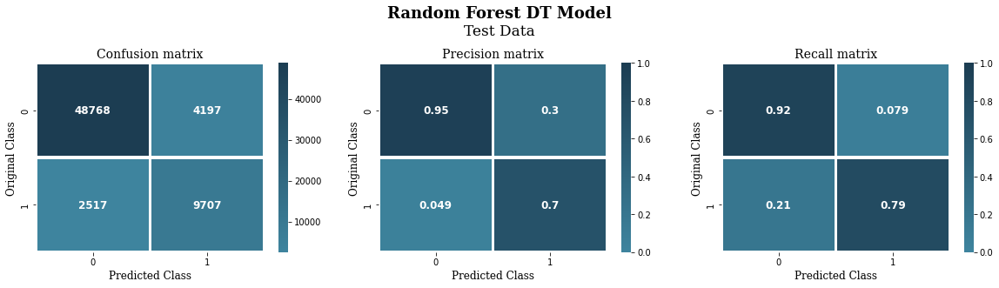

In [ ]:
plot_confusion_matrix("Random Forest DT Model", "Train Data", y_train, pr_tr)
plot_confusion_matrix("Random Forest DT Model", "Test Data", y_test, pr_te)

AUC Score on Train Data using Random Forest DT Model: 0.95407
F1 Score on Train Data using Random Forest DT Model: 0.75678


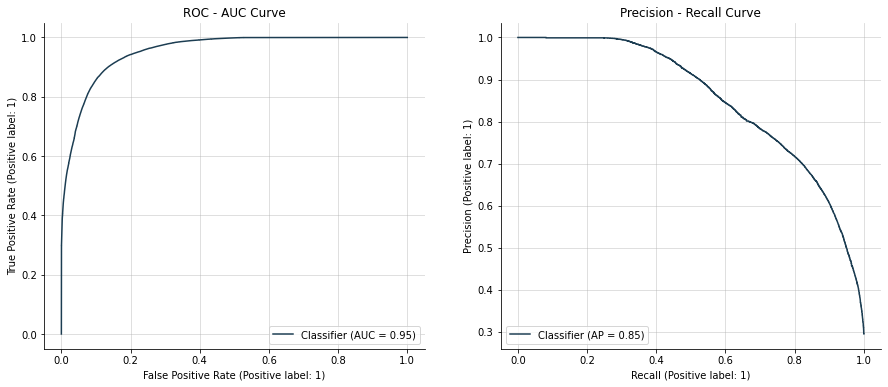

In [ ]:
print("\033[1mAUC Score\033[0m on \033[1mTrain Data\033[0m using \033[1mRandom Forest DT Model\033[0m: \033[1m{:.5f}\033[0m".format(roc_auc_score(y_train, predicted_y_tr[:,1])))
print("\033[1mF1 Score\033[0m on \033[1mTrain Data\033[0m using \033[1mRandom Forest DT Model\033[0m: \033[1m{:.5f}\033[0m".format(f_1_tr))

auc_f1_curve(y_train, predicted_y_tr[:,1])

AUC Score on Test Data using Random Forest DT Model: 0.94798
F1 Score on Test Data using Random Forest DT Model: 0.74298


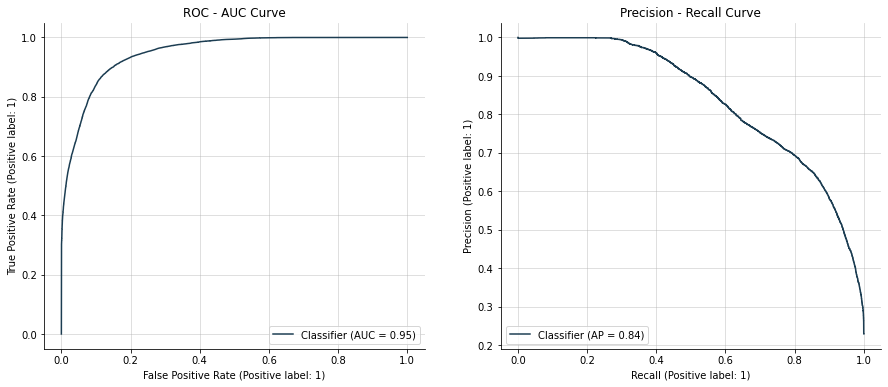

In [ ]:
print("\033[1mAUC Score\033[0m on \033[1mTest Data\033[0m using \033[1mRandom Forest DT Model\033[0m: \033[1m{:.5f}\033[0m".format(roc_auc_score(y_test, predicted_y_te[:,1])))
print("\033[1mF1 Score\033[0m on \033[1mTest Data\033[0m using \033[1mRandom Forest DT Model\033[0m: \033[1m{:.5f}\033[0m".format(f_1_te))

auc_f1_curve(y_test, predicted_y_te[:,1])

<h5> Prediction on Unseen Test Data for Kaggle Score </h5>

In [ ]:
predicted_y_te = clb_clf_rf.predict_proba(df_te)[:,1]

In [ ]:
df_res=pd.DataFrame({'QuoteNumber': qn_te,
             'QuoteConversion_Flag': predicted_y_te})

In [ ]:
df_res.to_csv("rf_result.csv", index=False)
!cp rf_result.csv "drive/My Drive/"

<h3> Gradient Boosting DT Classifier</h3>

In [ ]:
param={'n_estimators': [10, 50, 100], 'max_depth': [1,3,5]}

gb_clf = GradientBoostingClassifier(random_state=42)

model = GridSearchCV(gb_clf, param, scoring='roc_auc', cv=3, return_train_score=True, verbose=4)
model.fit(X_train, y_train)

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END max_depth=1, n_estimators=10;, score=(train=0.865, test=0.862) total time=   9.5s
[CV 2/3] END max_depth=1, n_estimators=10;, score=(train=0.863, test=0.865) total time=  10.2s
[CV 3/3] END max_depth=1, n_estimators=10;, score=(train=0.863, test=0.864) total time=   9.5s
[CV 1/3] END max_depth=1, n_estimators=50;, score=(train=0.922, test=0.920) total time=  41.8s
[CV 2/3] END max_depth=1, n_estimators=50;, score=(train=0.921, test=0.924) total time=  41.3s
[CV 3/3] END max_depth=1, n_estimators=50;, score=(train=0.922, test=0.921) total time=  42.2s
[CV 1/3] END max_depth=1, n_estimators=100;, score=(train=0.939, test=0.939) total time= 1.4min
[CV 2/3] END max_depth=1, n_estimators=100;, score=(train=0.939, test=0.941) total time= 1.4min
[CV 3/3] END max_depth=1, n_estimators=100;, score=(train=0.940, test=0.938) total time= 1.4min
[CV 1/3] END max_depth=3, n_estimators=10;, score=(train=0.937, test=0.936) total 

GridSearchCV(cv=3, estimator=GradientBoostingClassifier(random_state=42),
             param_grid={'max_depth': [1, 3, 5], 'n_estimators': [10, 50, 100]},
             return_train_score=True, scoring='roc_auc', verbose=4)

In [ ]:
result= pd.DataFrame(model.cv_results_)

tr_auc=result['mean_train_score'].values
cv_auc=result['mean_test_score'].values
n_estimators=result['param_n_estimators'].values
max_depth=result['param_max_depth'].values
tr_cv_diff=["{:.5f}".format(ti-ci) for ti,ci in zip(tr_auc, cv_auc)]
comp_df={"max_depth": max_depth, "n_estimators": n_estimators, "tr_auc":tr_auc, "cv_auc":cv_auc, "train_cv_diff":tr_cv_diff}
df_tmp=pd.DataFrame(comp_df)
df_tmp.sort_values(by=['cv_auc'],ascending=False)

,max_depth,n_estimators,tr_auc,cv_auc,train_cv_diff
8,5,100,0.968275,0.963178,0.00510
7,5,50,0.962350,0.959904,0.00245
5,3,100,0.959594,0.958630,0.00096
4,3,50,0.953757,0.953274,0.00048
6,5,10,0.950352,0.949340,0.00101
2,1,100,0.939472,0.939349,0.00012
3,3,10,0.936294,0.935857,0.00044
1,1,50,0.921664,0.921563,0.00010
0,1,10,0.863625,0.863626,-0.00000


In [ ]:
best_n_estimators=100
best_max_depth=5

In [ ]:
gb_clf = GradientBoostingClassifier(n_estimators=best_n_estimators, max_depth=best_max_depth, random_state=42)

clb_clf_gb=CalibratedClassifierCV(gb_clf, method='isotonic', n_jobs=-1)
clb_clf_gb.fit(X_train, y_train)

CalibratedClassifierCV(base_estimator=GradientBoostingClassifier(max_depth=5,
                                                                 random_state=42),
                       method='isotonic', n_jobs=-1)

In [ ]:
predicted_y_tr = clb_clf_gb.predict_proba(X_train)
predicted_y_te = clb_clf_gb.predict_proba(X_test)

In [ ]:
f_1_tr, f_1_te, pr_tr, pr_te, th=f1(y_train, predicted_y_tr, y_test, predicted_y_te)

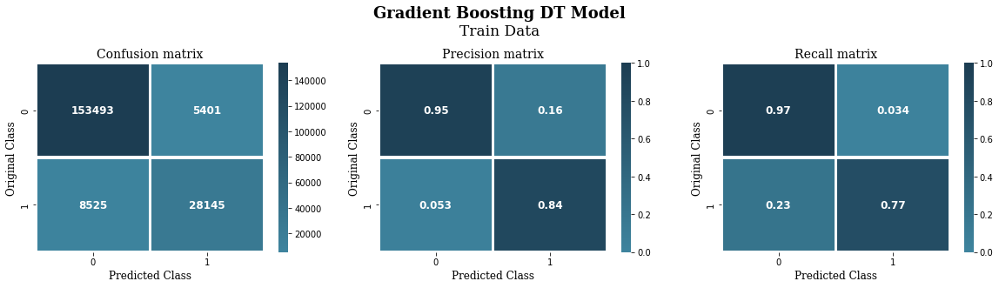

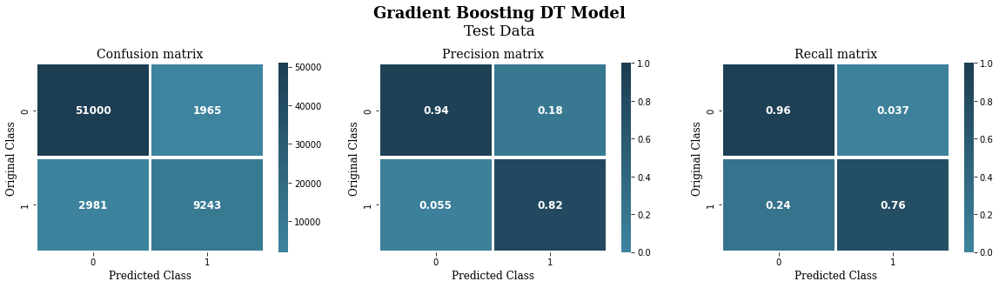

In [ ]:
plot_confusion_matrix(""Classroom Submission 2"Gradient Boosting DT Model", "Train Data", y_train, pr_tr)
plot_confusion_matrix("Gradient Boosting DT Model", "Test Data", y_test, pr_te)

AUC Score on Train Data using Gradient Boosting DT Model: 0.96746
F1 Score on Train Data using Gradient Boosting DT Model: 0.80167


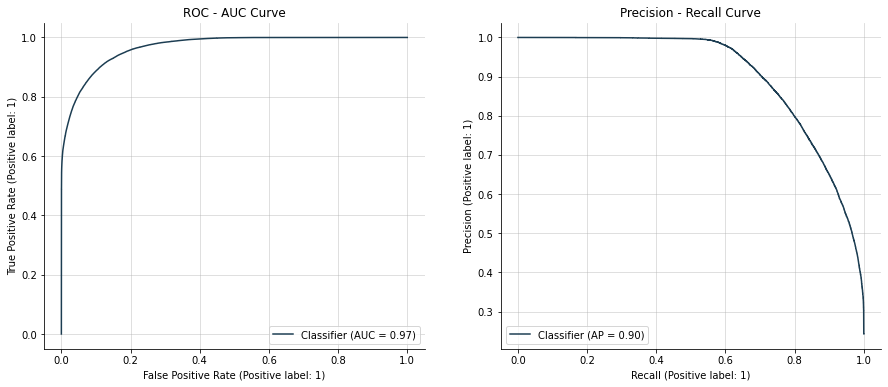

In [ ]:
print("\033[1mAUC Score\033[0m on \033[1mTrain Data\033[0m using \033[1mGradient Boosting DT Model\033[0m: \033[1m{:.5f}\033[0m".format(roc_auc_score(y_train, predicted_y_tr[:,1])))
print("\033[1mF1 Score\033[0m on \033[1mTrain Data\033[0m using \033[1mGradient Boosting DT Model\033[0m: \033[1m{:.5f}\033[0m".format(f_1_tr))

auc_f1_curve(y_train, predicted_y_tr[:,1])

AUC Score on Test Data using Gradient Boosting DT Model: 0.96311
F1 Score on Test Data using Gradient Boosting DT Model: 0.78885


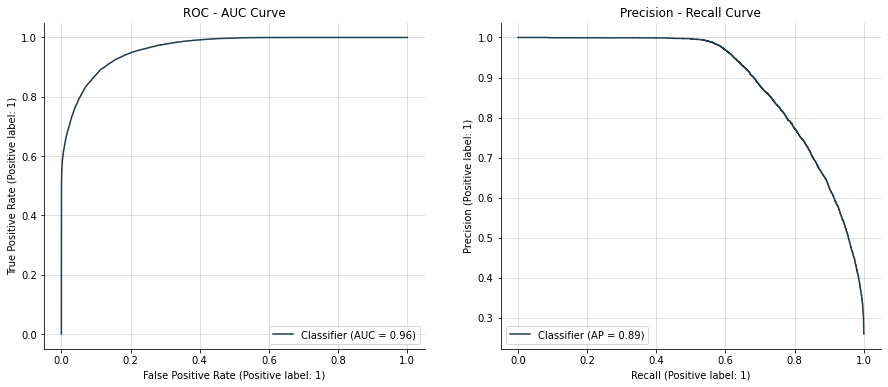

In [ ]:
print("\033[1mAUC Score\033[0m on \033[1mTest Data\033[0m using \033[1mGradient Boosting DT Model\033[0m: \033[1m{:.5f}\033[0m".format(roc_auc_score(y_test, predicted_y_te[:,1])))
print("\033[1mF1 Score\033[0m on \033[1mTest Data\033[0m using \033[1mGradient Boosting DT Model\033[0m: \033[1m{:.5f}\033[0m".format(f_1_te))

auc_f1_curve(y_test, predicted_y_te[:,1])

<h5> Prediction on Unseen Test Data for Kaggle Score </h5>

In [ ]:
predicted_y_te = clb_clf_gb.predict_proba(df_te)[:,1]

In [ ]:
df_res=pd.DataFrame({'QuoteNumber': qn_te,
             'QuoteConversion_Flag': predicted_y_te})

In [ ]:
df_res.to_csv("gb_result.csv", index=False)
!cp gb_result.csv "drive/My Drive/"

<h3> XGBoost Classifier </h3>

In [ ]:
# Here we use XGBoost Classifier to build a XGBoost model
# We perform hyperparameter tuning to find the best hyperparameters and then train the model with those hyperparameters

def objective(trial, X_train, y_train):

    '''This function is used for hyperparameter tuning using Optuna Module.
    It takes a trial and X_train, y_train as input, does hyperparameter tuning 
    and returns the AUC score for the respective trial'''

    param={
        'n_estimators': trial.suggest_int('n_estimators', 500,2000),
        'max_depth': trial.suggest_int('max_depth', 1,8),
        'learning_rate': trial.suggest_float('learning_rate', 0.0, 0.1),
        'subsample': trial.suggest_float('subsample', 0.1, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.1, 1.0)
    }

    xgb_clf=xgb.XGBClassifier(objective='binary:logistic',
                          tree_method='gpu_hist',
                          n_jobs=-1,
                          random_state=42, **param)
    
    score=cross_val_score(xgb_clf, X_train, y_train, scoring='roc_auc', n_jobs=-1, cv=4).mean()

    return score

In [ ]:
f = lambda trial:objective(trial, X_train, y_train) # This lambda function helps in passing multiple arguments to the objective function above

study=optuna.create_study(direction='maximize') # This creates a new study i.e. a set of trials for optimization purpose which tries to maximize the optimization
study.optimize(f, n_trials=50) # This passes the lambda function to the objective function above for optimization

[I 2022-09-21 10:03:04,409] A new study created in memory with name: no-name-bd01c074-332b-4737-bc47-794f68f2a1e6
[I 2022-09-21 10:06:16,467] Trial 0 finished with value: 0.9664875824103021 and parameters: {'n_estimators': 1535, 'max_depth': 7, 'learning_rate': 0.031238781371628156, 'subsample': 0.9712922374373757, 'colsample_bytree': 0.39470874025493385}. Best is trial 0 with value: 0.9664875824103021.
[I 2022-09-21 10:10:49,844] Trial 1 finished with value: 0.9650247374163107 and parameters: {'n_estimators': 1672, 'max_depth': 8, 'learning_rate': 0.04494382796637169, 'subsample': 0.7597353669211859, 'colsample_bytree': 0.32612052247323187}. Best is trial 0 with value: 0.9664875824103021.
[I 2022-09-21 10:11:59,309] Trial 2 finished with value: 0.9579822007904657 and parameters: {'n_estimators': 1410, 'max_depth': 1, 'learning_rate': 0.07620584099670076, 'subsample': 0.5364965904893035, 'colsample_bytree': 0.24935777271065232}. Best is trial 0 with value: 0.9664875824103021.
[I 2022-0

In [ ]:
bst=study.best_trial.params

In [ ]:
print("Parameters providing the best AUC score:")
bst

Parameters providing the best AUC score:


{'n_estimators': 1683,
 'max_depth': 5,
 'learning_rate': 0.033634063806304376,
 'subsample': 0.9018977620675989,
 'colsample_bytree': 0.7391973277026416}

In [ ]:
xgb_clf=xgb.XGBClassifier(objective='binary:logistic',
                          tree_method='gpu_hist',
                          n_jobs=-1,
                          random_state=42,
                          n_estimators=bst['n_estimators'],
                          max_depth=bst['max_depth'],
                          learning_rate=bst['learning_rate'],
                          subsample=bst['subsample'],
                          colsample_bytree=bst['colsample_bytree']
                          )

xgb_clf.fit(X_train, y_train)

XGBClassifier(colsample_bytree=0.7391973277026416,
              learning_rate=0.033634063806304376, max_depth=5,
              n_estimators=1683, n_jobs=-1, random_state=42,
              subsample=0.9018977620675989, tree_method='gpu_hist')

In [ ]:
predicted_y_tr = xgb_clf.predict_proba(X_train)
predicted_y_te = xgb_clf.predict_proba(X_test)

In [ ]:
f_1_tr, f_1_te, pr_tr, pr_te, th=f1(y_train, predicted_y_tr, y_test, predicted_y_te)

In [ ]:
print("Threshold for Maximum F1 Score on Training Data: \033[1m{:.5f}\033[0m".format(th))

Threshold for Maximum F1 Score on Training Data: 0.39881


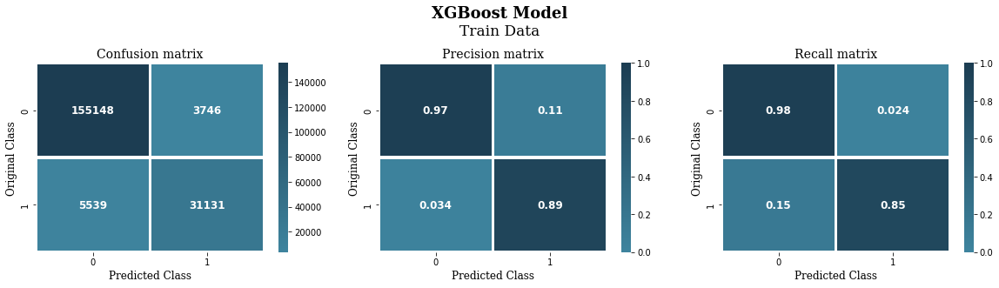

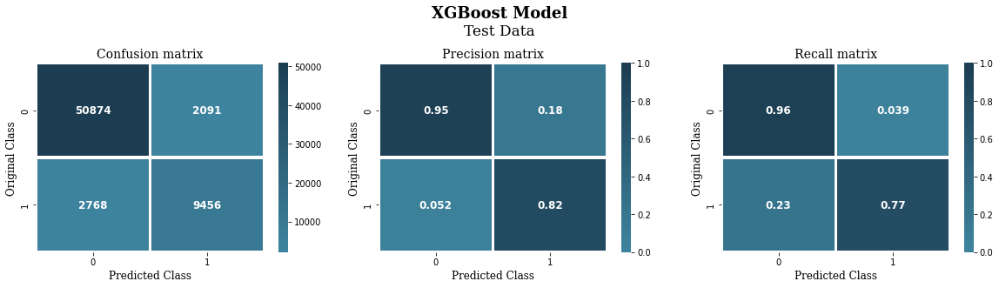

In [ ]:
plot_confusion_matrix("XGBoost Model", "Train Data", y_train, pr_tr)
plot_confusion_matrix("XGBoost Model", "Test Data", y_test, pr_te)

AUC Score on Train Data using XGBoost Model: 0.98522
F1 Score on Train Data using XGBoost Model: 0.87023


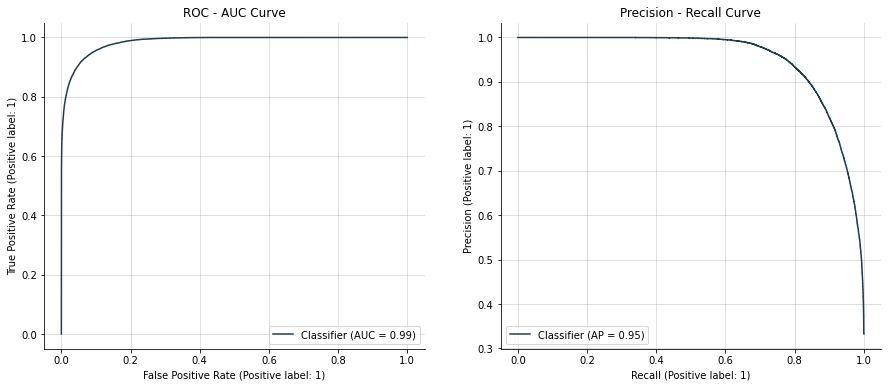

In [ ]:
print("\033[1mAUC Score\033[0m on \033[1mTrain Data\033[0m using \033[1mXGBoost Model\033[0m: \033[1m{:.5f}\033[0m".format(roc_auc_score(y_train, predicted_y_tr[:,1])))
print("\033[1mF1 Score\033[0m on \033[1mTrain Data\033[0m using \033[1mXGBoost Model\033[0m: \033[1m{:.5f}\033[0m".format(f_1_tr))

auc_f1_curve(y_train, predicted_y_tr[:,1])

AUC Score on Test Data using XGBoost Model: 0.96693
F1 Score on Test Data using XGBoost Model: 0.79552


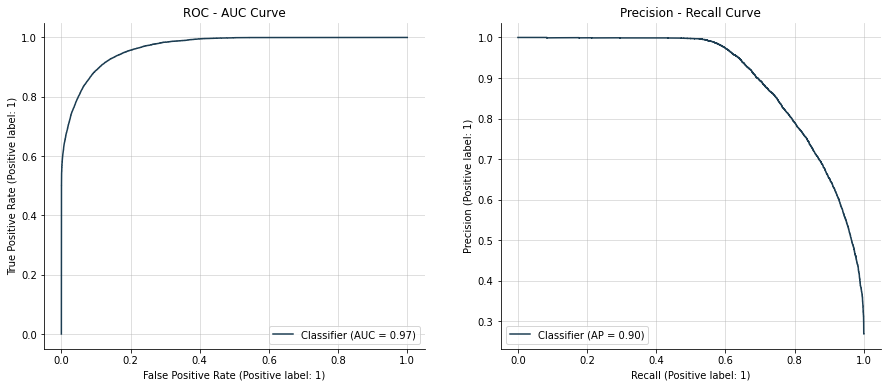

In [ ]:
print("\033[1mAUC Score\033[0m on \033[1mTest Data\033[0m using \033[1mXGBoost Model\033[0m: \033[1m{:.5f}\033[0m".format(roc_auc_score(y_test, predicted_y_te[:,1])))
print("\033[1mF1 Score\033[0m on \033[1mTest Data\033[0m using \033[1mXGBoost Model\033[0m: \033[1m{:.5f}\033[0m".format(f_1_te))

auc_f1_curve(y_test, predicted_y_te[:,1])

In [ ]:
joblib.dump(xgb_clf, '/content/drive/MyDrive/xgb_model.pkl')

['/content/drive/MyDrive/xgb_model.pkl']

<h5> Prediction on Unseen Test Data for Kaggle Submission </h5>

In [ ]:
predicted_y_te = xgb_clf.predict_proba(df_te)[:,1]

In [ ]:
df_res=pd.DataFrame({'QuoteNumber': qn_te,
             'QuoteConversion_Flag': predicted_y_te})

In [ ]:
df_res.to_csv("xgb_result.csv", index=False)
!cp xgb_result.csv "drive/My Drive/"

<h3> Kaggle Submission Result for Best Score </h3>

<img src = 'https://i.postimg.cc/1zV7gfxP/Screenshot-2.png' alt ='Screenshot of Result of the Submission in Kaggle'>

<h3> Model Performance Summary </h3>

In [ ]:
# Here we summarize the performance metrics of all the models that we built above

table = PrettyTable()
table.field_names = ['Model', 'Test AUC Score', 'Test F1 Score', 'Kaggle Private Score', 'Kaggle Public Score']

table.add_row(['Random Model', 0.49871, 0.27008, 'NA', 'NA'])
table.add_row(['Logistic Regression Model', 0.80297, 0.50448, 0.80511, 0.80654])
table.add_row(['Support Vector Machine Model', 0.82048, 0.53242, 0.82873, 0.82998])
table.add_row(['Decision Tree Model', 0.95607, 0.76598, 0.95699, 0.95795])
table.add_row(['Random Forest DT Model', 0.94798, 0.74298, 0.94927, 0.94928])
table.add_row(['Gradient Boosting DT Model', 0.96311, 0.78885, 0.96366, 0.96449])
table.add_row(['XGBoost Model', 0.96693, 0.79552, 0.96790, 0.96834])

print(table)

+------------------------------+----------------+---------------+----------------------+---------------------+
|            Model             | Test AUC Score | Test F1 Score | Kaggle Private Score | Kaggle Public Score |
+------------------------------+----------------+---------------+----------------------+---------------------+
|         Random Model         |    0.49871     |    0.27008    |          NA          |          NA         |
|  Logistic Regression Model   |    0.80297     |    0.50448    |       0.80511        |       0.80654       |
| Support Vector Machine Model |    0.82048     |    0.53242    |       0.82873        |       0.82998       |
|     Decision Tree Model      |    0.95607     |    0.76598    |       0.95699        |       0.95795       |
|    Random Forest DT Model    |    0.94798     |    0.74298    |       0.94927        |       0.94928       |
|  Gradient Boosting DT Model  |    0.96311     |    0.78885    |       0.96366        |       0.96449       |
|

# Conclusions

> *	**Train** dataset has **260,753** data-points and **299** features
> *	Only **19%** of the Quotes are converted
> *	**Test** dataset has **173,836** data-points and **298** features
> *	Duplicate Row was not present in any of the **Train** or **Test** dataset
> * All the **‘QuoteNumber’** are different in **Train** and **Test** dataset
> *	**FEATURE ENGINEERING:** A new column is added which contains the count of Null values in each row
> *	**89%** of the features are **Integer** type, **9%** are **Categorical (Object)** type and only **2%** are **Float** type in both **Train** and **Test** dataset
> * We imputed **Null** values with **-1** in both **Train** and **Test** dataset
> * We dropped **‘PropertyField6’** and **‘GeographicField10A’** from both **Train** and **Test** dataset as they contain only one unique value in the entire column
> *	Days, Months and Years are separated from **‘Original_Quote_Date’** from both **Train** and **Test** dataset, new feature having Weekday of the date is added and then **‘Original_Quote_Date’** column it is dropped
> *	From **January** to **December**, overall count of target variable decreases with the highest in **March** and the lowest in **December**
> * From **Mondays** to **Sundays**, overall count of target variable decreases with highest on **Mondays** and lowest on **Sundays**
> *	**Percentage** of **Quote Conversion Rate** remains almost at the same level in the plots of Year-wise, Month-wise and Day-wise distribution of Target variable. In Weekday-wise  distribution of Target variable, the **Percentage** remains almost same on **weekdays** but decreases on **weekends**
> *	**FEATURE ENGINEERING:** Two new columns are added, one will have count of all negations / Falses and other will have count of all the affirmations / Trues across all the features which have either **(0,1)** or **(N,Y)** as its element values
> *	As per the Competition Host, **-1** denotes a missing data. We count all the **-1s** across the rows and add the count in the column **'#_Null_Elms'**
> *	**FEATURE ENGINEERING:** As per the Competition Host, features whose name is ending with **'A'** and **'B'** are ordinal and are created with different approaches from its parent feature. A new column is created where the count of all column pairs where both the features values are equal is added. **-1** is excluded from above operation as **-1** only denotes missing data
> *	**New Jersey** has the highest rate of Quote Conversion followed by **California**, **Illinois** and **Texas**. Also, **California** tops in total number of Quotes followed by **New Jersey**, **Texas** and **Illinois**
> * **FEATURE ENGINEERING:** We added three new features **SF5_FE**, **SF1B_FE** and **PF9_FE** with values equal to conversion rate for the particular values of their parent features
> * **'PersonalField9-SF5_FE'** is the most important feature
> * **5** out of top **10** most important features are feature engineered
> * After modeling, the best **AUC** Score achieved was **0.96693** using **XGBoost** Classifier and the best **F1** Score achieved was **0.79552** using **XGBoost** Classifier